In [1]:
# Import necessary libraries

from bs4.element import NavigableString
import pandas as pd
import numpy as np
import spacy
import pickle
import requests
from bs4 import BeautifulSoup
import re
import gensim
import random
from gensim.models import Word2Vec
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# load model MARCA
ES_defs = [["mujer", "hombre"], ["nina", "nino"], ["ella", "él"], ["madre", "padre"], ["hija", "hijo"], ["chica", "chico"], ["femenino", "masculino"], ["hermana", "hermano"], ["maría", "juan"]]
w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\marca\sportword2vec.model")
PATH_VOCAB = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\marca\pipe7-vocab"
# load model AS
#w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\as\AsWord2Vec.model")
#PATH_VOCAB = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\as\As-vocab"
# load model MUNDO DEPOTIVO
#PATH_VOCAB =  r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\mundoDeportivo\MD-vocab"
#w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\mundoDeportivo\MDWord2Vec.model")
# load model Fútbol
#PATH_VOCAB =  r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\futbol\futbol-vocab"
#w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\futbol\FutbolMDEntero.model")
# load modelos Fútbol (ir cambiando año)
#PATH_VOCAB =  r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\2023\futbol-vocab"
#w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\2023\futbol2023.model")


c:\Users\marta\Anaconda3\lib\site-packages\sklearn\linear_model\least_angle.py:30: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  method='lar', copy_X=True, eps=np.finfo(np.float).eps,
c:\Users\marta\Anaconda3\lib\site-packages\sklearn\linear_model\least_angle.py:167: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  method='lar', copy_X=True,

# Preliminary analysis: PCA

In [2]:
# check similarity, how well do the gender pairs capture GENDER

'''She_he_classifier returns a list of gender paired words who describe gender by cheking proximity to reference words él y ella'''
def she_he_classifier(gender_pairs):
    pairs_check = []
    for (female_word, male_word) in gender_pairs:
        # compute cosine similarities
        d1 = w2v_model.wv.similarity(female_word, 'ella')
        d2 = w2v_model.wv.similarity(female_word, 'él')
        d3 = w2v_model.wv.similarity(male_word, 'ella')
        d4 = w2v_model.wv.similarity(male_word, 'él')
        if (d1 > d2) and (d3 < d4):
            pairs_check.append((female_word, male_word))
            print("Word "+female_word+" captures gender: "+str(d1)+" "+str(d2))
            print("Word "+male_word+" captures gender: "+str(d2)+" "+str(d1))
    return pairs_check
        
she_he_classifier([["mujer", "hombre"], ["nina", "nino"], ["ella", "él"], ["madre", "padre"], ["hija", "hijo"], ["chica", "chico"], ["femenino", "masculino"], ["hermana", "hermano"], ["maría", "juan"], ["tía", "tío"], ["hembra", "macho"]])

Word mujer captures gender: 0.81843215 0.48533824
Word hombre captures gender: 0.48533824 0.81843215
Word nina captures gender: 0.6707164 0.2993164
Word nino captures gender: 0.2993164 0.6707164
Word ella captures gender: 1.0 0.67664003
Word él captures gender: 0.67664003 1.0
Word madre captures gender: 0.81687236 0.5386227
Word padre captures gender: 0.5386227 0.81687236
Word hija captures gender: 0.7610728 0.41841397
Word hijo captures gender: 0.41841397 0.7610728
Word chica captures gender: 0.8000066 0.455199
Word chico captures gender: 0.455199 0.8000066
Word femenino captures gender: 0.17785853 0.13736409
Word masculino captures gender: 0.13736409 0.17785853
Word hermana captures gender: 0.7352383 0.4280007
Word hermano captures gender: 0.4280007 0.7352383
Word maría captures gender: 0.3609152 0.2863059
Word juan captures gender: 0.2863059 0.3609152
Word tía captures gender: 0.70431936 0.3423619
Word tío captures gender: 0.3423619 0.70431936


[('mujer', 'hombre'),
 ('nina', 'nino'),
 ('ella', 'él'),
 ('madre', 'padre'),
 ('hija', 'hijo'),
 ('chica', 'chico'),
 ('femenino', 'masculino'),
 ('hermana', 'hermano'),
 ('maría', 'juan'),
 ('tía', 'tío')]

In [7]:
# get a set of paired female and male words
# https://builtin.com/machine-learning/pca-in-python

# gender vector is the substraction of the male - female vector for each pair
def create_gender_v(gender_pairs):
    return [w2v_model.wv[female_word]-w2v_model.wv[male_word] for (female_word, male_word) in gender_pairs]
# standardize the data (mean = 0 & variance = 1)
from sklearn.preprocessing import StandardScaler

gender_v = create_gender_v(ES_defs)
standardized_v = StandardScaler().fit_transform(gender_v)
# get 3 principal components using PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca.fit(standardized_v)

var1 = pca.explained_variance_ratio_

[0.34025846 0.21470024 0.09783111]


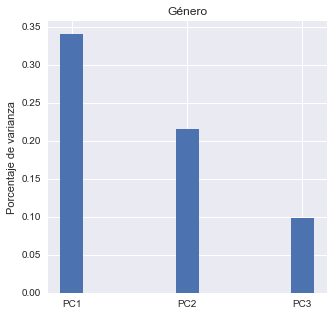

In [8]:
# plot for the gender subspace principal components
import matplotlib.pyplot as plt
print(var1)
fig = plt.figure(figsize = (5, 5))
values = ("PC1", "PC2", "PC3")
plt.style.use('seaborn')
plt.bar(values, var1, width = 0.2)
plt.ylabel("Porcentaje de varianza")
plt.title("Género")
plt.show()

Glosario con pares de términos para referirse a hombres y mujeres en el deporte, extraídas de la Guía para el tratamiento de la información deportiva sin estereotipos sexistas

In [9]:
femenine_words = ['abanderada', 'abogada', 'abonada', 'académica', 'acólita', 'acomodadora', 'acuñadora', 'adjunta', 'adversaria', 'aficionada', 'afiliada', 'agrimensora', 'alera', 'alevina',
                  'alineadora', 'amazona', 'andadora', 'animadora', 'anotadora', 'apoderada', 'apuntadora', 'árbitra', 'arquera', 'artillera', 'asesora', 'bateadora', 'bicampeona', 'bigoleadora',
                  'bloqueadora', 'bogadora', 'boleadora', 'boxeadora', 'buceadora', 'buza', 'cabeceadora', 'cancerbera', 'campeona', 'canoera', 'canterana', 'capitana', 'cazadora',
                  'cedida', 'cetrera', 'chazadora', 'chupona', 'chuteadora', 'clasificada', 'colegiada', 'colocadora', 'comisaria', 'companera', 'competidora', 'conductora', 'consejera', 'contadora',
                  'contraria', 'controladora', 'coordinadora', 'coreógrafa', 'corredora', 'cronoescaladora', 'cronometradora', 'cuidadora', 'defensora', 'delantera', 'delegada', 'deportiva', 'desfavorecida',
                  'desmarcada', 'directiva', 'directora', 'disenadora', 'dribladora', 'ejecutiva', 'ejecutora', 'empresaria', 'encargada', 'enemiga', 'entrenadora', 'disenadora', 'escaladora',
                  'escapada', 'esgrimidora', 'espectadora', 'esquiadora', 'expedicionaria', 'exploradora', 'extrema', 'fajadora', 'favorita', 'federada', 'federativa', 'enfermera', 'fisióloga',
                  'forofa', 'funámbula', 'galáctica', 'ganadora', 'garrochera', 'gerenta', 'gladiadora', 'goleadora', 'gregaria', 'guarnicionera', 'guerrera', 'haltera', 'halterófila', 'inspectora',
                  'instructora', 'intermediaria', 'interventora', 'jabata', 'jefa', 'jueza', 'jugadora', 'herida', 'heroína', 'herradora', 'lanzadora', 'lenera', 'lesionada', 'levantadora', 'líbera',
                  'limpiadora', 'luchadora', 'maestra', 'mandataria', 'marcadora', 'marchadora', 'mecánica', 'médica', 'medidora', 'mentora', 'monitora', 'monopatinadora', 'montanera', 'moza',
                  'nadadora', 'navegadora', 'notaria', 'novata', 'oficiala', 'olímpica', 'operadora', 'operaria', 'organizadora', 'paralímpica', 'pasadora', 'pasajera', 'patinadora', 'patrocinadora',
                  'patrona', 'pegadora', 'pelotera', 'pentacampeona', 'peona', 'percanterana', 'perdedora', 'perita' 'perseguidora', 'pescadora', 'pilota', 'piscinera', 'pistera', 'podóloga', 'portadora',
                  'porteadora', 'preparadora', 'presidenta', 'principianta', 'probadora', 'profesora', 'pseudoextrema', 'psicóloga', 'puntera', 'quinesióloga', 'pupila', 'realizadora',
                   'rebotadora', 'receptora', 'recogedora', 'recordwoman', 'regateadora', 'remadora', 'rematadora', 'remera', 'revendedora', 'rezagada', 'rodadora', 'sacadora', 'sacrificada', 'saltadora',
                   'secadora', 'secretaria', 'seguidora', 'seleccionadora', 'servidora', 'socia', 'soltadora', 'subalterna', 'subcampeona', 'surfera', 'sustituta', 'talonadora', 'tanteadora', 'teatrera',
                   'técnica', 'tiradora', 'todaterreno', 'trainera', 'traumatóloga', 'trazadora', 'trigoleadora', 'triunfadora', 'usuaria', 'utilera', 'vencedora', 'veterana', 'vicegerenta', 'vicelideresa',
                   'vicepresidenta', 'zaguera']

masculine_words = ['abanderado', 'abogado', 'abonado', 'académico', 'acólito', 'acomodador', 'acuñador', 'adjunto', 'adversario', 'aficionado', 'afiliado', 'agrimensor', 'alero', 'alevín',
                  'alineador', 'jinete', 'andador', 'animador', 'anotador', 'apoderado', 'apuntador', 'árbitro', 'arquero', 'artillero', 'asesor', 'bateador', 'bicampeón', 'bigoleador',
                  'bloqueador', 'bogador', 'boleador', 'boxeador', 'buceador', 'buzo', 'cabeceador', 'cancerbero', 'campeón', 'canoero', 'canterano', 'capitán', 'cazador', 
                  'cedido', 'cetrero', 'chazador', 'chupón', 'chuteador', 'clasificado', 'colegiado', 'colocador', 'comisario', 'companero', 'competidor', 'conductor', 'consejero', 'contador',
                  'contrario', 'controlador', 'coordinador', 'coreógrafo', 'corredor', 'cronoescalador', 'cronometrador', 'cuidador', 'defensor', 'delantero', 'delegado', 'deportivo', 
                  'desfavorecido','desmarcado', 'directivo', 'director', 'disenador', 'driblador', 'ejecutivo', 'ejecutor', 'empresario', 'encargado', 'enemigo', 'entrenador', 'disenador', 
                  'escalador','escapado', 'esgrimidor', 'espectador', 'esquiador', 'expedicionario', 'explorador', 'extremo', 'fajador', 'favorito', 'federado', 'federativo', 'enfermero', 'fisiólogo',
                  'forofo', 'funámbulo', 'galáctico', 'ganador', 'garrochero', 'gerente', 'gladiador', 'goleador', 'gregario', 'guarnicionero', 'guerrero', 'haltero', 'halterófilo', 'inspector',
                  'instructor', 'intermediario', 'interventor', 'jabato', 'jefe', 'juez', 'jugador', 'herido',  'héroe', 'herrador', 'lanzador', 'lenero', 'lesionado', 'levantador', 'líbero',
                  'limpiador', 'luchador', 'maestro', 'mandatario', 'marcador', 'marchador', 'mecánico', 'médico', 'medidor', 'mentor', 'monitor', 'monopatinador', 'montanero', 'mozo',
                  'nadador', 'navegador', 'notario', 'novato', 'oficial', 'olímpico', 'operador', 'operario', 'organizador', 'paralímpico', 'pasador', 'pasajero', 'patinador', 'patrocinador',
                  'patrón', 'pegador', 'pelotero', 'pentacampeón', 'peón', 'percanterano', 'perdedor', 'perito' 'perseguidor', 'pescador', 'piloto', 'piscinero', 'pistero', 'podólogo', 'portador',
                  'porteador', 'preparador', 'presidente', 'principiante', 'probador', 'profesor', 'pseudoextremo', 'psicólogo', 'puntero', 'quinesiólogo', 'pupilo', 'realizador',
                   'rebotador', 'receptor', 'recogedor', 'recordman', 'regateador', 'remador', 'rematador', 'remero','revendedor', 'rezagado', 'rodador', 'sacador', 'sacrificado', 'saltador',
                   'secador', 'secretario', 'seguidor', 'seleccionador', 'servidor', 'socio', 'soltador', 'subalterno', 'subcampeón', 'surfero', 'sustituto', 'talonador', 'tanteador', 'teatrero',
                   'técnico', 'tirador', 'todoterreno', 'trainero', 'traumatólogo', 'trazador', 'trigoleador', 'triunfador', 'usuario', 'utilero', 'vencedor', 'veterano', 'vicegerente', 'vicelíder',
                   'vicepreseidente', 'zaguero']

In [10]:
print(len(femenine_words))

print(len(masculine_words))

221
221


In [11]:
'''Analizamos si las palabras del glosario están en el vocabulario. Gender pairs resultante de
eliminar los términos no presentes y emparejar todos los pares.'''
c = 0
indexes = []
excluded_words_fem = []
excluded_words_masc = []
for i in range(len(femenine_words)):
    if femenine_words[i] in w2v_model.wv.index_to_key:
        c +=1
    if femenine_words[i] not in w2v_model.wv.index_to_key and i not in indexes:
        indexes.append(i)
        if masculine_words[i] in w2v_model.wv.index_to_key:
            print(masculine_words[i])
print("Femenine words: ",c)

c = 0
for i in range(len(masculine_words)):
    if masculine_words[i] in w2v_model.wv.index_to_key:
        c +=1
    if masculine_words[i] not in w2v_model.wv.index_to_key:
        if femenine_words[i] in w2v_model.wv.index_to_key:
            print(femenine_words[i])
        if i not in indexes:
            indexes.append(i)
print("Masculine words: ", c)

for index in sorted(indexes, reverse=True):
    del femenine_words[index]
    del masculine_words[index]

gender_pairs = []
for i in range(len(masculine_words)):
    gender_pairs.append([femenine_words[i], masculine_words[i]])

print(len(gender_pairs))

acólito
alero
alevín
alineador
apuntador
bateador
buzo
chupón
driblador
fajador
fisiólogo
funámbulo
gerente
interventor
herrador
lenero
oficial
peón
podólogo
principiante
probador
recogedor
todoterreno
trigoleador
utilero
Femenine words:  173
acomodadora
haltera
trainera
vicepresidenta
Masculine words:  194
169


In [26]:
#seleccionar las 50 palabras que mas aparecen en el vocabulario
# para ello hago la media entre la variante femenina y la variante masculina

# Loading the tokenized data
import pickle
with open(PATH_VOCAB, "rb") as fp:   # Unpickling
    b = pickle.load(fp)

# dictionary contains the word counts
dictionary = {}
for article in b:
    for lemma in article:
        if lemma not in dictionary.keys():
            dictionary[lemma] = 1
        else:
            dictionary[lemma] += 1

# get mean of word freq in female and male words
freqs = [((dictionary[femenine_word]+dictionary[male_word])/2, femenine_word, male_word) for (femenine_word, male_word) in gender_pairs]
# sort in descending order
sorted_freqs = sorted(freqs, key=lambda x: x[0], reverse=True)

In [27]:
sorted_gender_pairs = []
for i in range(50):
    sorted_gender_pairs.append([sorted_freqs[i][1], sorted_freqs[i][2]])


In [14]:
print(sorted_gender_pairs)

[['jugadora', 'jugador'], ['técnica', 'técnico'], ['entrenadora', 'entrenador'], ['deportiva', 'deportivo'], ['campeona', 'campeón'], ['presidenta', 'presidente'], ['delantera', 'delantero'], ['directora', 'director'], ['ganadora', 'ganador'], ['marcadora', 'marcador'], ['companera', 'companero'], ['pilota', 'piloto'], ['capitana', 'capitán'], ['olímpica', 'olímpico'], ['cedida', 'cedido'], ['goleadora', 'goleador'], ['favorita', 'favorito'], ['extrema', 'extremo'], ['contraria', 'contrario'], ['seleccionadora', 'seleccionador'], ['árbitra', 'árbitro'], ['médica', 'médico'], ['jefa', 'jefe'], ['lesionada', 'lesionado'], ['encargada', 'encargado'], ['aficionada', 'aficionado'], ['clasificada', 'clasificado'], ['canterana', 'canterano'], ['directiva', 'directivo'], ['jueza', 'juez'], ['veterana', 'veterano'], ['conductora', 'conductor'], ['colegiada', 'colegiado'], ['corredora', 'corredor'], ['vencedora', 'vencedor'], ['preparadora', 'preparador'], ['empresaria', 'empresario'], ['abogada

## K-FOLDS Cross validation
Perform k-folds cross validation to observe the variance between the experiment. Each experiment takes a subset of paired words of the gender_pairs list and outputs the explained variance of the first principal component after performing PCA on that subset.

In [28]:
# K-FOLDS Cross Validation

''' Function that splits the data into k folds, returns a list with sublists
        Input: k (# ), gender_pairs (list)
        Output: experiments (list) '''
def get_k_folds(k, gender_pairs):
    # pick number of folds
    # copy the list of input
    input_data = gender_pairs.copy()
    # split the dataset into k equal parts
    experiments = []
    # randomize selection of data in the folds
    np.random.shuffle(input_data)
    input_data = list(input_data)

    for i in range(k-1):
        experiments.append(input_data[:round(len(gender_pairs)/k)]) 
        del input_data[:round(len(gender_pairs)/k)]
    if len(input_data) != 0:
        experiments.append(input_data)
    return experiments

'''Function that performs PCA on selected vectors
    Input: experiment (list of word pairs)
    Output: explained variance of the principal component'''
def calculate_pca(experiment):
    gender_v= [w2v_model.wv[pair[0]]-w2v_model.wv[pair[1]] for pair in experiment]
    standardized_v = StandardScaler().fit_transform(gender_v)
    pca = PCA(n_components=3)
    pca.fit(standardized_v)
    return pca.explained_variance_ratio_[0]


In [29]:
# Experimento con palabras genéricas (la media de 10 iteraciones)
res_mean = []
res_stdev = []

for i in range(10):
    experiments = get_k_folds(2, ES_defs)
    print(experiments)
    results = []
    for experiment in experiments:
        results.append(calculate_pca(experiment))
    res_stdev.append(np.std(results))
    res_mean.append(np.mean(results))

print(np.mean(res_mean))
print(np.mean(res_stdev))


[[['ella', 'él'], ['hembra', 'macho'], ['mujer', 'hombre'], ['chica', 'chico'], ['hermana', 'hermano'], ['maría', 'juan']], [['hija', 'hijo'], ['nina', 'nino'], ['tía', 'tío'], ['femenino', 'masculino'], ['madre', 'padre']]]
[[['femenino', 'masculino'], ['ella', 'él'], ['hermana', 'hermano'], ['hija', 'hijo'], ['maría', 'juan'], ['hembra', 'macho']], [['chica', 'chico'], ['tía', 'tío'], ['mujer', 'hombre'], ['madre', 'padre'], ['nina', 'nino']]]
[[['femenino', 'masculino'], ['tía', 'tío'], ['mujer', 'hombre'], ['nina', 'nino'], ['maría', 'juan'], ['madre', 'padre']], [['chica', 'chico'], ['hija', 'hijo'], ['ella', 'él'], ['hermana', 'hermano'], ['hembra', 'macho']]]
[[['chica', 'chico'], ['ella', 'él'], ['hija', 'hijo'], ['hembra', 'macho'], ['femenino', 'masculino'], ['maría', 'juan']], [['tía', 'tío'], ['mujer', 'hombre'], ['madre', 'padre'], ['nina', 'nino'], ['hermana', 'hermano']]]
[[['maría', 'juan'], ['nina', 'nino'], ['chica', 'chico'], ['hermana', 'hermano'], ['tía', 'tío'], [

In [30]:
# con palabras genéricas, validación cruzada dejando uno fuera
def k_validation_generic(words):
    results = []
    for i in range(len(words)):
        # sacar 1a palabra de los sets
        deleted = words.pop(0)
        # experimento
        results.append(calculate_pca(words))
        words.append(deleted)
    np.array(results)
    return(np.mean(results), np.std(results))

k_validation_generic(ES_defs)

(0.3085930284952294, 0.01441560084348998)

In [31]:
# Experimentos con glosario K-folds cross validation
folds = [5, 10, 15, 20]
for k in folds:
    experiments = get_k_folds(k, gender_pairs)
    for experiment in experiments:
        
        results = []
        for experiment in experiments:
            results.append(calculate_pca(experiment))

    st_dev = np.std(results)
    mean = np.mean(results)
    print(st_dev, mean)

0.01671589536646131 0.1361449805533254
0.02160533137405822 0.1754223778772897
0.02762648311467966 0.21368895338298713
0.03967614095300695 0.25992999792391747


In [20]:
# seleccionar las 50 palabras que mas aparecen en el vocabulario
# para ello hago la media entre la variante femenina y la variante masculina

# Loading the tokenized data
import pickle
with open(PATH_VOCAB, "rb") as fp:   # Unpickling
    b = pickle.load(fp)

# dictionary contains the word counts
dictionary = {}
for article in b:
    for lemma in article:
        if lemma not in dictionary.keys():
            dictionary[lemma] = 1
        else:
            dictionary[lemma] += 1

# get mean of word freq in female and male words
def get_word_frequencies(word_pairs):
    freqs = [((dictionary[femenine_word]+dictionary[male_word])/2, dictionary[femenine_word], dictionary[male_word], femenine_word, male_word) for (femenine_word, male_word) in word_pairs]
    sorted_freqs = sorted(freqs, key=lambda x: x[0], reverse=True)
    return sorted_freqs

In [22]:
ES_defs = [["mujer", "hombre"], ["nina", "nino"], ["ella", "él"], ["madre", "padre"], ["hija", "hijo"], ["chica", "chico"], 
           ["femenino", "masculino"], ["hermana", "hermano"], ["tía", "tío"], ["maría", "juan"], ["hembra", "macho"]]
sorted_freqs = get_word_frequencies(ES_defs)
print(sorted_freqs)

[(35369.0, 20759, 49979, 'ella', 'él'), (12641.5, 10831, 14452, 'maría', 'juan'), (10670.0, 10943, 10397, 'mujer', 'hombre'), (10090.0, 9639, 10541, 'madre', 'padre'), (7650.0, 5889, 9411, 'hija', 'hijo'), (6107.5, 8907, 3308, 'femenino', 'masculino'), (3715.5, 2101, 5330, 'hermana', 'hermano'), (3657.0, 1921, 5393, 'nina', 'nino'), (2622.0, 1969, 3275, 'chica', 'chico'), (958.0, 419, 1497, 'tía', 'tío'), (57.0, 19, 95, 'hembra', 'macho')]


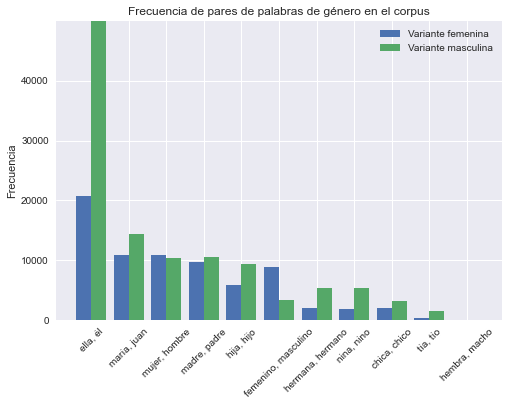

In [23]:
# plot sorted freqs
def plot_frequencies(arr):
    import matplotlib.pyplot as plt
    plt.style.use("seaborn")
    fem_words = [elem[1] for elem in arr]
    masc_words = [elem[2] for elem in arr]
    tags = [elem[3] + ", "+ elem[4]  for elem in arr]

    X_axis = np.arange(len(tags)) 
    ax=plt.gca()
    ax.set_ylim([0,max((max(fem_words), max(masc_words)))])
    plt.bar(X_axis - 0.2, fem_words, 0.4, label = 'Variante femenina') 
    plt.bar(X_axis + 0.2, masc_words, 0.4, label = 'Variante masculina')
    plt.xticks(X_axis, tags, rotation=45) 
    plt.ylabel("Frecuencia")
    plt.title("Frecuencia de pares de palabras de género en el corpus")
    plt.legend()
    plt.show()

plot_frequencies(sorted_freqs)

# Desarrollo de las métricas


In [32]:
from sklearn.decomposition import PCA
import io

'''Return word vector (normalized). If OOV, return empty list'''
def get_vector(word):
    try:
        return w2v_model.wv[word] / np.linalg.norm(w2v_model.wv[word])
    except:
        return []

def doPCA_differences(pairs, num_components = 9):
    matrix = []
    for a, b in pairs:
        center = (get_vector(a) + get_vector(b)) / 2
        female = get_vector(a) - center
        male = get_vector(b) - center
        matrix.append(female - male)
    matrix = np.array(matrix)
    pca = PCA(n_components = num_components)
    pca.fit(matrix)
    #fig = plt.figure(figsize = (5, 5))
    #plt.style.use('seaborn')
    #plt.ylabel("Porcentaje de varianza")
    #plt.xlabel("Componentes principales")
    #plt.title("PCA sobre vectores de género")
    #plt.bar(range(num_components), pca.explained_variance_ratio_)
    return pca

#https://github.com/shaoxia57/Bias_in_Gendered_Languages/blob/master/bias_emnlp19.ipynb
def doPCA_centroids(pairs, num_components = 2):
    matrix = []
    female_sum = np.zeros(100)
    male_sum = np.zeros(100)
    center = np.zeros(100)
    for a,b in pairs:
        female_sum += get_vector(a)
        male_sum += get_vector(b)
        center += (male_sum + female_sum) / 2
    matrix.append(female_sum - center)
    matrix.append(male_sum - center)
    matrix = np.array(matrix)
    pca = PCA(n_components = num_components)
    pca.fit(matrix)
    #fig = plt.figure(figsize = (5, 5))
    #plt.style.use('seaborn')
    #plt.ylabel("Porcentaje de varianza")
    #plt.xlabel("Componentes principales")
    #plt.title("PCA sobre vectores de género")
    #plt.bar(range(num_components), pca.explained_variance_ratio_)
    return pca

# Gender Bias Metrics

In [33]:
#------------ DIRECT BIAS ------------
ES_defs = [["mujer", "hombre"], ["nina", "nino"], ["ella", "él"], ["madre", "padre"], ["hija", "hijo"], ["chica", "chico"], ["femenino", "masculino"], ["hermana", "hermano"], ["maría", "juan"]]
#ES_gender_direction = doPCA_differences(ES_defs).components_[0]

'''Given definitional words and a type, create the gender subspace g'''
def gender_subspace(words, type="centroids"):
    if type == "centroids":
        g = doPCA_centroids(words).components_[0]
    elif type == "differences":
        g = doPCA_differences(words, len(words)).components_[0]
    return g

# PROYECTAR EXPERIMENTOS SOBRE VECTOR DE GÉNERO
'''Given a list of words (str), returns a list of tuples (word (str), projection on gender vector (float))'''
def create_projections(words, g):
    projection = []
    for w in words:
        # normalizar
        normalized_w = get_vector(w)
        # proyección = producto escalar
        projection.append((normalized_w.dot(g), w))
    projection.sort()
    return projection

'''Center the words'''
def center_words(projections):
    vectors = [w[0] for w in projections]
    mean = np.mean(vectors)
    return [w-mean for w in vectors]

''' Get Direct Bias score averaging the results'''
def get_bias_from_proj(projection):
    absolute_values = [abs(elem[0]) for elem in projection]
    return sum(absolute_values) / len(projection)

# extra experiment with stereotypical words, to check if it works
exp_forzado = ["madre", "padre", "hija", "hijo", "hermano", "hermana", "chica", "chico", "femenino", "masculino", "mujer", "hombre"]

'''Leave-one-out cross validation'''
def statistical_directBias(words, exp, type="centroids"):
    results = []
    for i in range(len(words)):
        # sacar 1a palabra de los sets
        deleted = words.pop(0)
        # experimento
        if type == "centroids":
            g = doPCA_centroids(words).components_[0]
        elif type == "differences":
            g = doPCA_differences(words, len(words)).components_[0]
        words.append(deleted)
        result = get_bias_from_proj(create_projections(exp, g))
        results.append(result)
    return np.array(results)

### Direct bias automatic tests

In [34]:
exp = []
set_X = ["ejecutivo", "gestión", "profesional", "corporación", "salario", "oficina", "negocios", "carrera"]
set_Y = ["hogar", "padres", "hijos", "familia", "primos", "matrimonio", "boda", "parientes"]
exp.append((set_X + set_Y))

set_X= ["precoz", "ingenioso", "curioso", "genio", "astuto", "adaptable", "reflexivo", "perspicaz", "intuitivo", "sensato", "analítico", "apto", "venerable", "imaginativo",
        "sabio", "inteligente", "sagaz", "brillante", "lógico"]
set_Y=["seductora", "doméstico", "sensual", "hermosa", "delgada", "calva", "atlético", "moda", "corpulento", "feo", "musculoso", "esbelto", "guapo", "sano", "atractivo", "gordo", "delgado", "bonito", "hermoso"]
exp.append((set_X + set_Y))

set_X = ["fuerte", "seguridad", "dominante", "potente", "afirmar", "ruidoso", "audaz", "éxito", "triunfo", "líder", "grito", "ganador"]
set_Y = ["débil", "rendido", "timidez", "vulnerable", "debilidad", "tenue", "fracaso", "seguir", "perder", "frágil", "asustado", "perdedor"]
exp.append((set_X + set_Y))

# bras como victoria, fuerza, líder, profesional, dinero, capitán, campeón, premios, referente, ídolo
set_X = ["victoria", "fuerza", "líder", "profesional", "dinero", "capitán", "campeón", "premios", "referente", "ídolo"]
set_Y = ["madre", "guapa", "novia", "mujer", "pareja", "débil", "bella", "derrota", "fracaso", "belleza"]
exp.append((set_X + set_Y))
result = {'Periódico':[],
        'Direct Bias':[],
        'Mean':[],
        'Stdev': []}

for i in range(2):
    # set TYPE to do first difference results and then centroid results
    if i == 0:
        type = "differences"
    else:
        type = "centroids"

    for i in range(3):
        # load models
        if i == 0:
            w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\marca\sportword2vec.model")
            periodico = "Marca"
        elif i == 1:
            w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\as\AsWord2Vec.model")
            periodico = "As"
        else:
            w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\mundoDeportivo\MDWord2Vec.model")
            periodico = "Mundo Deportivo"
        # do the experiments    
        for experiment in exp:
            proj = create_projections(experiment, gender_subspace(ES_defs,type))
            score = get_bias_from_proj(proj)
            sign = statistical_directBias(ES_defs, experiment, type)
                
            result["Periódico"].append(periodico)
            result["Direct Bias"].append(score)
            result["Mean"].append(np.mean(sign))
            result["Stdev"].append(np.std(sign))

excel = pd.DataFrame.from_dict(result)
#path = r"C:\Users\marta\OneDrive\Documentos\experimentosTFG"
file_name = 'DirectBias.xlsx'
#import os
#excel.to_excel(os.path.join(path,file_name))

excel

,Periódico,Direct Bias,Mean,Stdev
0,Marca,0.095185,0.098531,0.017468
1,Marca,0.093834,0.096286,0.019470
2,Marca,0.110972,0.111373,0.017401
3,Marca,0.114369,0.117151,0.026647
4,As,0.057821,0.063655,0.014256
5,As,0.066282,0.072304,0.020158
6,As,0.087115,0.097828,0.031339
7,As,0.067494,0.077620,0.029601
8,Mundo Deportivo,0.087138,0.095228,0.027038
9,Mundo Deportivo,0.084752,0.087230,0.012624


In [35]:
exp = []
set_X = ["ejecutivo", "gestión", "profesional", "corporación", "salario", "oficina", "negocios", "carrera"]
set_Y = ["hogar", "padres", "hijos", "familia", "primos", "matrimonio", "boda", "parientes"]
exp.append((set_X + set_Y))
set_X= ["precoz", "ingenioso", "curioso", "genio", "astuto", "adaptable", "perspicaz", "intuitivo", "sensato", "analítico", "apto", "imaginativo",
        "sabio", "inteligente", "brillante", "lógico"]
set_Y=["seductora", "doméstico", "sensual", "hermosa", "delgada", "atlético", "moda", "corpulento", "feo", "guapo", "sano", "atractivo", "gordo", "delgado", "bonito", "hermoso"]
exp.append((set_X + set_Y))
set_X = ["fuerte", "seguridad", "dominante", "potente", "afirmar", "ruidoso", "audaz", "éxito", "triunfo", "líder", "grito", "ganador"]
set_Y = ["débil", "rendido", "timidez", "vulnerable", "debilidad", "tenue", "fracaso", "seguir", "perder", "frágil", "asustado", "perdedor"]
exp.append((set_X + set_Y))
set_X = ["líder", "profesional", "dinero", "capitán", "campeón", "premios", "referente", "ídolo"]
set_Y = ["guapa", "novia", "pareja", "débil", "bella", "derrota", "fracaso", "belleza"]
exp.append((set_X + set_Y))

result = {'2019':[],
        'Mean2019':[],
        'Stdev2019':[],
        '2020':[],
        'Mean2020':[],
        'Stdev2020':[],
        '2021':[],
        'Mean2021':[],
        'Stdev2021':[],
        '2022':[],
        'Mean2022':[],
        'Stdev2022':[],
        '2023':[],
        'Mean2023':[],
        'Stdev2023':[]}

init = 2019
model = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models" +"\ ".strip() +str(init) + "\ ".strip() + "futbol" + str(init)+".model"
print(model)

for c in range(2):
    if c == 0:
        type = "differences"
    else:
        type = "centroids"

    for i in range(2019, 2024):
        model = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models" +"\ ".strip() +str(i) + "\ ".strip() + "futbolMD" + str(i)+".model"
        w2v_model = Word2Vec.load(model)

        # do the experiments    
        for experiment in exp:
                proj = create_projections(experiment, gender_subspace(ES_defs,type))
                score = get_bias_from_proj(proj)
                sign = statistical_directBias(ES_defs, experiment, type)   
                result[str(i)].append(score)
                result["Mean"+str(i)].append(np.mean(sign))
                result["Stdev"+str(i)].append(np.std(sign))

excel = pd.DataFrame.from_dict(result)
path = r"C:\Users\marta\OneDrive\Documentos\experimentosTFG"
import os
excel.to_excel(os.path.join(path,r'DirectBiastemporal.xlsx'))


C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\2019\futbol2019.model


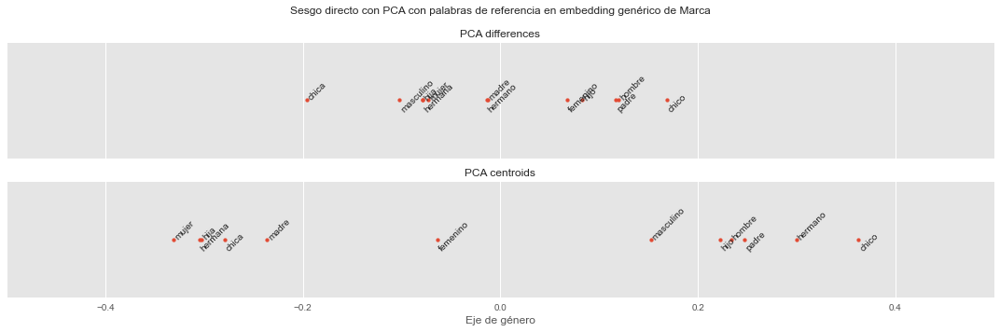

In [36]:
# PLOT DIRECT BIAS
# MATPLOTLIB GRAPH REPRESENTATION
# generate 3 subplots

ES_defs = [["mujer", "hombre"], ["nina", "nino"], ["ella", "él"], ["madre", "padre"], ["hija", "hijo"], ["chica", "chico"], ["femenino", "masculino"], ["hermana", "hermano"], ["maría", "juan"]]
w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\marca\sportword2vec.model")
PATH_VOCAB = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\marca\pipe7-vocab"
# load model AS
#w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\as\AsWord2Vec.model")
#PATH_VOCAB = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\as\As-vocab"
# load model MUNDO DEPOTIVO
#PATH_VOCAB =  r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\mundoDeportivo\MD-vocab"
#w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\mundoDeportivo\MDWord2Vec.model")

forz_diff = create_projections(exp_forzado, gender_subspace(ES_defs,"differences"))
res_diff = center_words(forz_diff)
forz_centroids = create_projections(exp_forzado, gender_subspace(ES_defs,"centroids"))
res_centroids = center_words(forz_centroids)

fig, axs = plt.subplots(2, sharex=True)
fig.set_size_inches(15, 5)
plt.style.use('seaborn')
fig.suptitle("Sesgo directo con PCA con palabras de referencia en embedding genérico de Marca")

# plot results from experiment 1
axs[0].scatter(res_diff, [0]*len(res_diff), s=15)
for i in range(len(res_diff)):
    if i%2 == 0:
        axs[0].text(res_diff[i], 0, forz_diff[i][1]).set_rotation(45)
    else:
        axs[0].text(res_diff[i], - 0.011, forz_diff[i][1]).set_rotation(45)

# plot results from experiment 2
axs[1].scatter(res_centroids, [0]*len(res_centroids), s=15)
for i in range(len(res_centroids)):
    if i%2 == 0:
        axs[1].text(res_centroids[i], 0, forz_centroids[i][1]).set_rotation(45)
    else:
        axs[1].text(res_centroids[i], - 0.011, forz_centroids[i][1]).set_rotation(45)

# set titles of the experiment
axs[0].set_title("PCA differences")
axs[1].set_title("PCA centroids")
# set x axis label
axs[1].set_xlabel("Eje de género")
#axs.set_aspect('equal')
for i in range(2):
    axs[i].set_xlim(-0.5,0.5)
    axs[i].set_yticks([])

plt.show()


[(-0.19888435, 'corporación'), (-0.0981601, 'boda'), (-0.090678155, 'oficina')]
-------
[(0.18968841, 'familia'), (0.21248734, 'profesional'), (0.2228323, 'carrera')]
[(-0.17758721, 'sensual'), (-0.15388763, 'seductora'), (-0.07435471, 'delgada')]
-------
[(0.22211254, 'brillante'), (0.22412224, 'sensato'), (0.25371063, 'genio')]
[(-0.02367387, 'audaz'), (0.019879935, 'perdedor'), (0.039355785, 'grito')]
-------
[(0.23794927, 'fracaso'), (0.27698264, 'fuerte'), (0.3001778, 'rendido')]
[(-0.111863606, 'guapa'), (-0.10108286, 'novia'), (-0.08448819, 'belleza')]
-------
[(0.22674459, 'ídolo'), (0.23794927, 'fracaso'), (0.28512704, 'referente')]


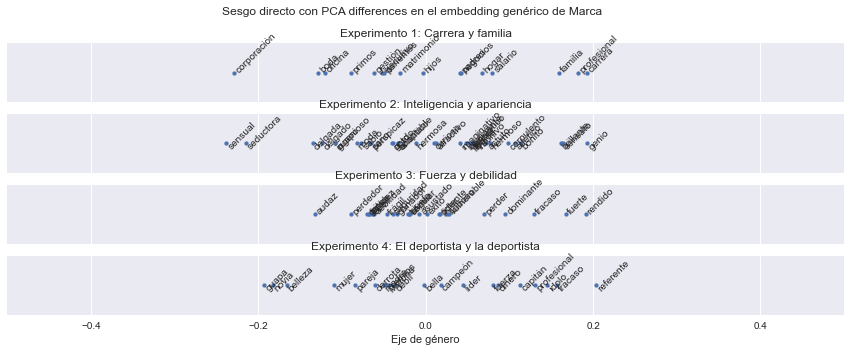

[(-0.16961162, 'parientes'), (-0.14630687, 'primos'), (-0.12536687, 'padres')]
-------
[(0.02786664, 'oficina'), (0.060644045, 'ejecutivo'), (0.13489614, 'salario')]
[(-0.09255212, 'moda'), (-0.06590019, 'delgada'), (-0.053994484, 'corpulento')]
-------
[(0.15529183, 'sabio'), (0.21225312, 'astuto'), (0.21828303, 'gordo')]
[(-0.11820076, 'débil'), (-0.08770919, 'seguridad'), (-0.08266553, 'tenue')]
-------
[(0.15923919, 'perdedor'), (0.16755351, 'fracaso'), (0.19749486, 'timidez')]
[(-0.1521103, 'madre'), (-0.11820076, 'débil'), (-0.015003562, 'novia')]
-------
[(0.1550619, 'líder'), (0.15696707, 'dinero'), (0.16755351, 'fracaso')]


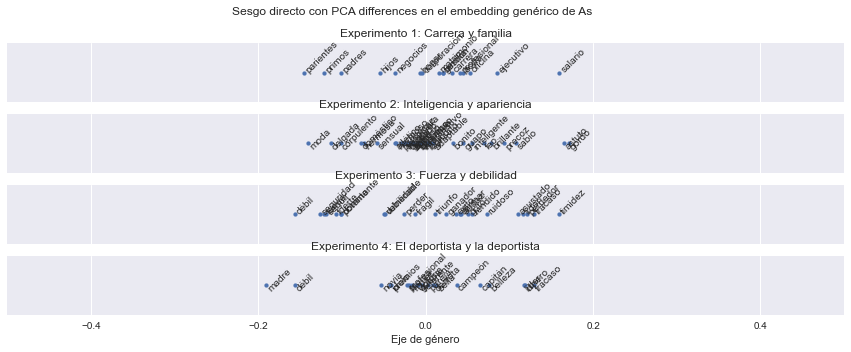

[(-0.2033447, 'corporación'), (-0.19500263, 'primos'), (-0.13854188, 'boda')]
-------
[(0.08355233, 'hogar'), (0.10821225, 'gestión'), (0.16007948, 'salario')]
[(-0.21362896, 'sensual'), (-0.06447533, 'delgada'), (-0.027001642, 'delgado')]
-------
[(0.20770036, 'sano'), (0.23729432, 'analítico'), (0.25844947, 'imaginativo')]
[(-0.03374646, 'ganador'), (-0.020306919, 'tenue'), (-0.006757673, 'grito')]
-------
[(0.19678438, 'fuerte'), (0.21304494, 'rendido'), (0.21937831, 'asustado')]
[(-0.19394526, 'premios'), (-0.18387556, 'mujer'), (-0.14484966, 'guapa')]
-------
[(0.1747192, 'referente'), (0.1907967, 'dinero'), (0.29506242, 'capitán')]


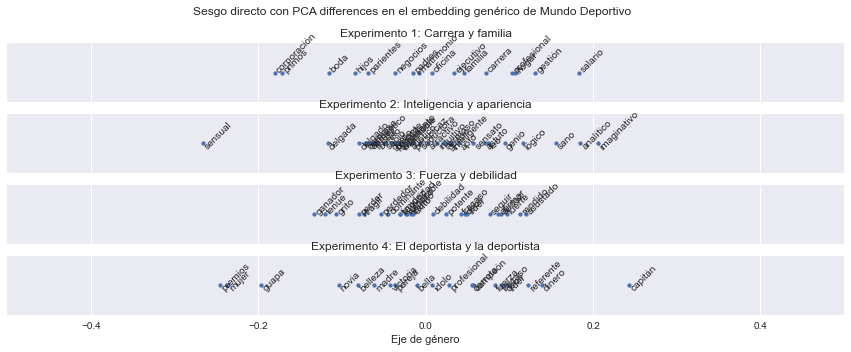

In [13]:
# PLOT DIRECT BIAS
# MATPLOTLIB GRAPH REPRESENTATION
# generate 3 subplots
import time
exp = []
set_X = ["ejecutivo", "gestión", "profesional", "corporación", "salario", "oficina", "negocios", "carrera"]
set_Y = ["hogar", "padres", "hijos", "familia", "primos", "matrimonio", "boda", "parientes"]
exp.append((set_X + set_Y))
set_X= ["precoz", "ingenioso", "curioso", "genio", "astuto", "adaptable", "perspicaz", "intuitivo", "sensato", "analítico", "apto", "imaginativo",
        "sabio", "inteligente", "brillante", "lógico"]
set_Y=["seductora", "doméstico", "sensual", "hermosa", "delgada", "atlético", "moda", "corpulento", "feo", "guapo", "sano", "atractivo", "gordo", "delgado", "bonito", "hermoso"]
exp.append((set_X + set_Y))
set_X = ["fuerte", "seguridad", "dominante", "potente", "afirmar", "ruidoso", "audaz", "éxito", "triunfo", "líder", "grito", "ganador"]
set_Y = ["débil", "rendido", "timidez", "vulnerable", "debilidad", "tenue", "fracaso", "seguir", "perder", "frágil", "asustado", "perdedor"]
exp.append((set_X + set_Y))
set_X = ["victoria", "fuerza", "líder", "profesional", "dinero", "capitán", "campeón", "premios", "referente", "ídolo"]
set_Y = ["madre", "guapa", "novia", "mujer", "pareja", "débil", "bella", "derrota", "fracaso", "belleza"]
exp.append((set_X + set_Y))

def plot_results_directBias(experiments, embedding, type):
    # get embedding

    fig, axs = plt.subplots(4, sharex=True)
    fig.set_size_inches(15, 5)
    plt.style.use('seaborn')
    title = "Sesgo directo con PCA "+type+" en el embedding genérico de "+embedding
    fig.suptitle(title)

    for i in range(len(experiments)):
        proj = create_projections(experiments[i], gender_subspace(ES_defs,type))
        print(proj[:3])
        print("-------")
        print(proj[-3:])
        res = center_words(proj)
        # plot results from experiment 1
        axs[i].scatter(res, [0]*len(res), s=15)
        for j in range(len(proj)):
            if i%2 == 0:
                axs[i].text(res[j], 0, proj[j][1]).set_rotation(45)
            else:
                axs[i].text(res[j], - 0.011, proj[j][1]).set_rotation(45)

    # set titles of the experiment
    axs[0].set_title("Experimento 1: Carrera y familia")
    axs[1].set_title("Experimento 2: Inteligencia y apariencia")
    axs[2].set_title("Experimento 3: Fuerza y debilidad")
    axs[3].set_title("Experimento 4: El deportista y la deportista")
    # set x axis label
    axs[3].set_xlabel("Eje de género")
    #axs.set_aspect('equal')
    for i in range(4):
        axs[i].set_xlim(-0.5,0.5)
        axs[i].set_yticks([])

    plt.show()

embeddings = ["Marca", "As", "Mundo Deportivo"]

for e in embeddings:
    if e == "Marca":
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\marca\sportword2vec.model")
        PATH_VOCAB = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\marca\pipe7-vocab"

    if e == "As":
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\as\AsWord2Vec.model")
        PATH_VOCAB = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\as\As-vocab"

    if e == "Mundo Deportivo":
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\mundoDeportivo\MDWord2Vec.model")
        PATH_VOCAB =  r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\mundoDeportivo\MD-vocab"
    plot_results_directBias(exp, e, "differences")
    time.sleep(5)

# WEAT

In [37]:
#------------ WEAT SCORE ------------
''' Conjuntos de palabras objetivo neutras (hipothesis):
    - X: anticipa sesgo hacia A
    - Y: anticipa sesgo hacia B
    
    Conjuntos sesgados:
    - A: sesgo masculino
    - B: sesgo femenino
     
    Interpretación de los resultados:
     Valor positivo indica que las palabras de X se inclinan hacia A y las
     palabras de Y se inclinan hacia B -> se confirma sesgo ''' 
    
set_A = [ male_word for (female_word, male_word) in ES_defs]
set_B = [ female_word for (female_word, male_word) in ES_defs]

''' calculates s(w,A,B) for each w in X or Y'''
def word_individual_bias(word, A, B):
    n = len(A)
    b1 = 0
    b2 = 0
    for w in A:
        b1 += w2v_model.wv.similarity(word, w)
    for w in B:
        b2 += w2v_model.wv.similarity(word, w)
    return b1/n - b2/n

''' calculates s(w, A, B) in gendered words'''
def individual_bias_gender(word_f, word_m, A, B):
    return abs((abs(word_individual_bias(word_m, A, B))-abs(word_individual_bias(word_f, A, B))))

''' computes WEAT score for gendered languages given sets X, Y, A, B'''
def weat_score_gender(X, Y, A, B):
    resX = []
    resY = []

    for word in X:
        if isinstance(word, str):
            b = abs(word_individual_bias(word, A, B))
            resX.append(b)
        if isinstance(word, tuple):
            (f_w, m_w) = word
            b = individual_bias_gender(f_w, m_w, A, B)
            resX.append(b)

    for word in Y:
        if isinstance(word,str):
            resY.append(abs(word_individual_bias(word, A, B)))
        if isinstance(word, tuple):
            (f_w, m_w) = word
            b = individual_bias_gender(f_w, m_w, A, B)
            resY.append(b)
    #return abs((abs(sum(resX)) - abs(sum(resY))))
    return (np.mean(resX)-np.mean(resY)) / np.std(resX+resY)

''' Computes weat score given sets X, Y, A, B'''
def weat_score(X, Y, A, B):
    resX = [word_individual_bias(word, A, B) for word in X]
    resY = [word_individual_bias(word, A, B) for word in Y]
    #return sum(resX) - sum(resY) 
    # segun un vid de youtube este es el weat SCORE https://www.youtube.com/watch?v=eTenkUPsjko&ab_channel=AIAnytime
    return (np.mean(resX)-np.mean(resY)) / np.std(resX+resY)

def weat_test_statistic(X, Y, A, B):
    resX = [word_individual_bias(word, A, B) for word in X]
    resY = [word_individual_bias(word, A, B) for word in Y]
    return sum(resX) - sum(resY)

def weat_test_statistic_gender(X, Y, A, B):
    resX = []
    resY = []

    for word in X:
        if isinstance(word, str):
            b = abs(word_individual_bias(word, A, B))
            resX.append(b)
        if isinstance(word, tuple):
            (f_w, m_w) = word
            b = individual_bias_gender(f_w, m_w, A, B)
            resX.append(b)

    for word in Y:
        if isinstance(word,str):
            resY.append(abs(word_individual_bias(word, A, B)))
        if isinstance(word, tuple):
            (f_w, m_w) = word
            b = individual_bias_gender(f_w, m_w, A, B)
            resY.append(b)
    return abs((abs(sum(resX)) - abs(sum(resY))))


### WEAT statistical significance p-value

In [38]:
import random
from scipy import stats
import statsmodels.api as sm

'''Study of variance with leave-one-out cross validation of the A-B sets.'''
def weat_significance_test_attr(x, y, set_A, set_B):
    res = []
    for i in range(len(set_A)):
        # sacar 1a palabra de los sets
        del_A = set_A.pop(0)
        del_B = set_B.pop(0)
        # experimento
        res.append(weat_score(x,y,set_A,set_B))
        # devolver elemento eliminado al final de la cola
        set_A.append(del_A)
        set_B.append(del_B)
    return np.array(res)

def weat_significance_test_gender_attr(x, y, set_A, set_B):
    res = []
    for i in range(len(set_A)):
        # sacar 1a palabra de los sets
        del_A = set_A.pop(0)
        del_B = set_B.pop(0)
        # experimento
        res.append(weat_score_gender(x,y,set_A,set_B))
        # devolver elemento eliminado
        set_A.append(del_A)
        set_B.append(del_B)
    return np.array(res)

'''Permutation test WEAT'''
def p_value_weat(t1, t2, att1, att2): 
    diff_association = weat_test_statistic(t1, t2, att1, att2)
    target_words = np.concatenate([t1, t2])
    np.random.shuffle(target_words)

    partition_differentiation = []
    for i in range(10000):
        seq = np.random.permutation(target_words)
        tar1_words = seq[:len(target_words) // 2]
        tar2_words = seq[len(target_words) // 2:]
        partition_differentiation.append(
            weat_test_statistic(tar1_words, tar2_words, att1, att2)
            )
            
    mean = np.mean(partition_differentiation)
    stdev = np.std(partition_differentiation)
    p_val = 1 - stats.norm(loc=mean, scale=stdev).cdf(diff_association)
    sm.qqplot(np.array(partition_differentiation), line="45", fit='True')
    #pylab.show()
    shapiro = stats.shapiro(partition_differentiation)
    print("Mean: ", mean, "\n\n", "stdev: ", stdev, "\n\n partition ass: ", partition_differentiation, '\n\n association: ', diff_association, '\n\n p value: ', p_val)
    return shapiro[0], shapiro[1], mean, stdev, p_val

'''Permutation test WEAT gender'''
def p_value_weat_gender(t1, t2, att1, att2): 
    diff_association = weat_test_statistic_gender(t1, t2, att1, att2)
    target_words = np.concatenate([t1, t2])
    np.random.shuffle(target_words)

    partition_differentiation = []
    for i in range(10000):
        seq = np.random.permutation(target_words)
        tar1_words = seq[:len(target_words) // 2]
        tar2_words = seq[len(target_words) // 2:]
        partition_differentiation.append(
            weat_test_statistic_gender(tar1_words, tar2_words, att1, att2)
            )
            
    mean = np.mean(partition_differentiation)
    stdev = np.std(partition_differentiation)
    p_val = 1 - stats.norm(loc=mean, scale=stdev).cdf(diff_association)
    sm.qqplot(np.array(partition_differentiation), line="45", fit='True')
    #pylab.show()
    shapiro = stats.shapiro(partition_differentiation)
    print("Mean: ", mean, "\n\n", "stdev: ", stdev, "\n\n partition ass: ", partition_differentiation, '\n\n association: ', diff_association, '\n\n p value: ', p_val)
    return shapiro[0], shapiro[1], mean, stdev, p_val

# P value test statistic for WEAT

c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  0.0031428405198178043 

 stdev:  0.3467766986628452 

 partition ass:  [0.40559035735592874, 0.2749987815752523, 0.387135265492058, 0.46711420837608697, 0.05162437238808104, 0.015037053115924626, 0.09472748445114121, 0.5476215688136614, -0.5086064107340968, -0.38517738934994344, 0.24446909211757073, 0.11894330247175988, -0.4738759942184617, -0.3086508170947331, -0.3869100776565676, -0.2715740340904126, 0.05817461013147196, 0.02071395267396131, 0.6167717716695432, 0.31320366852580467, -0.0793744125985541, -0.31030006292146733, -0.4856410207058718, -0.27248195899624594, 0.19378425688612166, -0.33613455803262887, 0.016497083674443802, -0.40232584636477353, -0.001978095782558642, -0.31418953267469385, -0.33421775057730785, -0.5903854548038605, -0.24875743655462024, -0.6151162794623006, 0.022593742967324415, 0.13933119763128665, -0.3054649822556207, -0.16323854897766277, 0.5031619000494378, 0.07065749555800321, -0.29787549035649546, -0.26405714634003935, -0.46711420837608697, -0.0921

c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  0.001030822488313748 

 stdev:  0.27157368108132146 

 partition ass:  [0.11584407642173267, -0.2576326621023731, -0.0942598363746785, -0.2715637400591126, 0.28065329746136236, 0.09155249649969241, 0.23246888632679152, 0.5732702412383837, 0.08049340207233202, -0.17221569112088117, -0.12098163617257432, -0.06356163703215609, -0.012598341046315076, -0.4119872921922555, -0.4783186313644466, -0.11846560542471712, 0.2175761826802045, -0.028350989308415175, 0.44782329094596207, 0.4289205358622388, 0.424448645906523, -0.13177094559392163, -0.14729397348128265, 0.3692934980046833, 0.23272558542278898, 0.2826481948141008, 0.01772646106676093, -0.5845494381307315, -0.14374869324577355, 0.04303221510619762, -0.35041438490669763, 0.07772794213249448, -0.2825756765539862, 0.06563630656132269, -0.11409174674190581, 0.2793202527229571, -0.18006593022599, -0.4290394219311161, -0.10973911186576712, -0.09937251517031764, 0.28627464322683704, -0.6090287533330005, -0.1485682456598928, -0.2393645890

c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  -0.007073134202272112 

 stdev:  0.2870532828926716 

 partition ass:  [-0.7249997386760596, -0.45187327558071244, -0.08512488724146455, 0.3041624845678194, -0.03456701527142697, -0.16862955309140187, 0.16998759856344095, 0.16785777476616198, 0.018792051123455056, 0.12823609441208328, 0.2645944367525064, 0.239651546218536, -0.2732798555193262, -0.15845580774152448, -0.04575302728658748, -0.048096441896632314, 0.10174747967782133, 0.26360904588364076, -0.09604082507495248, -0.25738697129094773, 0.4740929703693837, -0.24530201847665012, -0.040955259956212575, -0.060528302332386374, 0.1912249768308054, 0.1641013378846563, -0.3061953859869391, -0.06532606966276133, -0.5711563031654805, 0.5906693622625123, 0.475530853934793, -0.09736928263575678, -0.08166341036040747, 0.11159630950229871, -0.16588408161058185, 0.2534209655649546, 0.21959005412645646, 0.3132747161564313, 0.32990340735866786, 0.4222893107216806, 0.2218409183486883, 0.33393519410553074, -0.20550576196466053, 0.028380664

,Periódico,Shapiro,Shapiro_p_value,Mean_normal,Stdev_normal,P_value
0,Marca,0.999111,3.390449e-05,0.003143,0.346777,0.004270
1,Marca,0.999310,4.770793e-04,0.009102,0.577299,0.003243
2,Marca,0.999363,1.001551e-03,-0.004268,0.349915,0.201526
3,Marca,0.999516,9.203875e-03,0.001376,0.653952,0.000422
4,As,0.997034,2.838133e-13,0.001031,0.271574,0.256287
5,As,0.998944,4.424405e-06,-0.002516,0.539017,0.000962
6,As,0.997538,9.769132e-12,0.000942,0.279238,0.302988
7,As,0.999163,6.624268e-05,-0.003499,0.514279,0.001121
8,Mundo Deportivo,0.999110,3.355468e-05,-0.007073,0.287053,0.002161
9,Mundo Deportivo,0.999289,3.568210e-04,0.000225,0.527209,0.001922


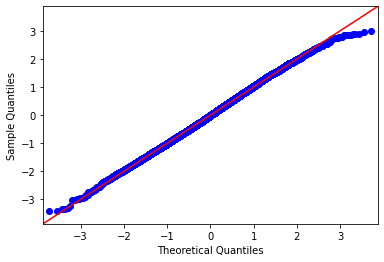

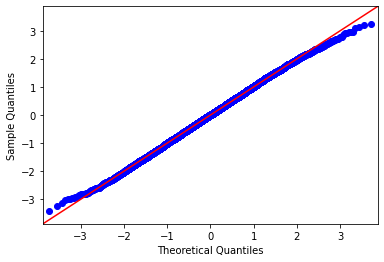

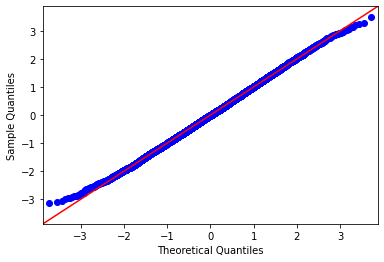

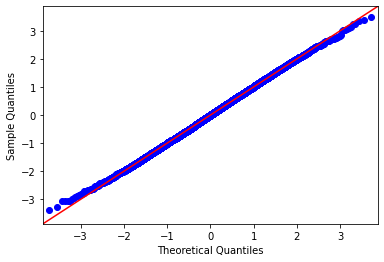

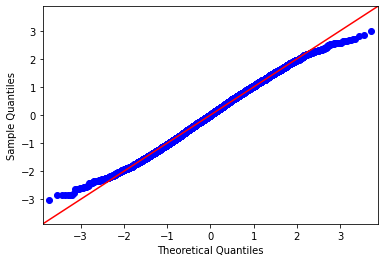

...

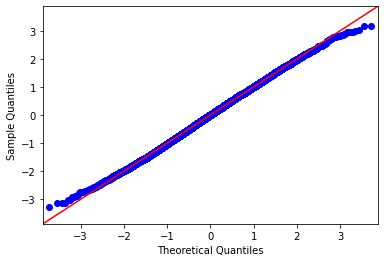

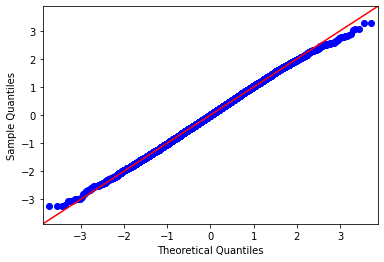

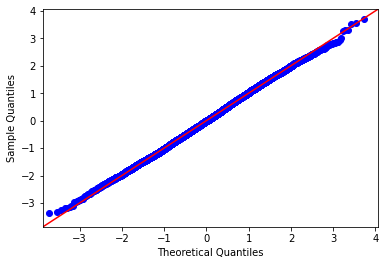

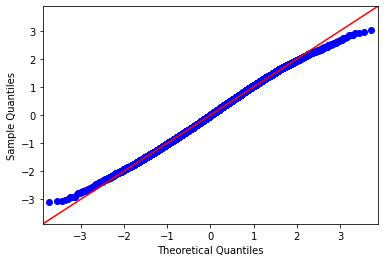

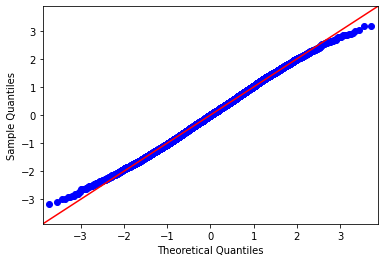

In [10]:
exp = []
set_X = ["ejecutivo", "gestión", "profesional", "corporación", "salario", "oficina", "negocios", "carrera"]
set_Y = ["hogar", "padres", "hijos", "familia", "primos", "matrimonio", "boda", "parientes"]
exp.append((set_X, set_Y))
print(len(set_X))
set_X= ["precoz", "ingenioso", "curioso", "genio", "astuto", "adaptable", "reflexivo", "perspicaz", "intuitivo", "sensato", "analítico", "apto", "venerable", "imaginativo",
        "sabio", "inteligente", "sagaz", "brillante", "lógico"]
set_Y=["seductora", "doméstico", "sensual", "hermosa", "delgada", "calva", "atlético", "moda", "corpulento", "feo", "musculoso", "esbelto", "guapo", "sano", "atractivo", "gordo", "delgado", "bonito", "hermoso"]
exp.append((set_X, set_Y))
print(len(set_Y))
set_X = ["fuerte", "seguridad", "dominante", "potente", "afirmar", "ruidoso", "audaz", "éxito", "triunfo", "líder", "grito", "ganador"]
set_Y = ["débil", "rendido", "timidez", "vulnerable", "debilidad", "tenue", "fracaso", "seguir", "perder", "frágil", "asustado", "perdedor"]
exp.append((set_X, set_Y))
print(len(set_Y))
set_X = ["victoria", "fuerza", "líder", "profesional", "dinero", "capitán", "campeón", "premios", "referente", "ídolo"]
set_Y = ["madre", "guapa", "novia", "mujer", "pareja", "débil", "bella", "derrota", "fracaso", "belleza"]
exp.append((set_X, set_Y))

result = {'Periódico':[],
        'Shapiro':[],
        'Shapiro_p_value':[],
        'Mean_normal': [],
        'Stdev_normal':[],
        'P_value':[]}

embeddings = ["Marca", "As", "Mundo Deportivo"]

for e in embeddings:
    if e == "Marca":
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\marca\sportword2vec.model")
        PATH_VOCAB = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\marca\pipe7-vocab"

    if e == "As":
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\as\AsWord2Vec.model")
        PATH_VOCAB = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\as\As-vocab"

    if e == "Mundo Deportivo":
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\mundoDeportivo\MDWord2Vec.model")
        PATH_VOCAB =  r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\mundoDeportivo\MD-vocab"
    
    for (x, y) in exp:
        res = p_value_weat(x, y, set_A, set_B)
        result["Periódico"].append(e)
        result["Shapiro"].append(res[0])
        result["Shapiro_p_value"].append(res[1])
        result["Mean_normal"].append(res[2])
        result["Stdev_normal"].append(res[3])
        result["P_value"].append(res[4])

excel = pd.DataFrame.from_dict(result)
path = r"C:\Users\marta\OneDrive\Documentos\experimentosTFG"
import os
excel.to_excel(os.path.join(path,r'WEATPvalPeriodicos.xlsx'))
excel


<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  0.1703304296745479 

 stdev:  0.1224168683624316 

 partition ass:  [0.11397359401841334, 0.0024512681217552235, 0.01939660082441863, 0.3015179558488953, 0.15598992464624117, 0.1426453786552886, 0.10821940910924843, 0.06676201233252255, 0.07699376830391391, 0.3038432980020943, 0.15933060155172518, 0.28002546195380573, 0.08503657759865746, 0.15130724282547214, 0.2897599747779571, 0.1649401638618051, 0.2056805528118275, 0.12949079907007732, 0.20464894352092722, 0.06794521087754712, 0.17350658509854433, 0.14966501243179653, 0.14694516195838014, 0.25908756700422, 0.13296878002195944, 0.14923478673962443, 0.36514564961220863, 0.09783464483269988, 0.06346855741382251, 0.05792419787677394, 0.07978327164245358, 0.15290619759535828, 0.19804937309042236, 0.16336642944952473, 0.4349240208523245, 0.11094239256474081, 0.172237334093855, 0.0671217083969774, 0.3478795591185594, 0.5160184782063071, 0.3301129204596186, 0.08153117488836881, 0.059624729361126394, 0.2319329708051454, 0.118763547034

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  0.18452687495665418 

 stdev:  0.1350865856912888 

 partition ass:  [0.0959114274786163, 0.07162612135935992, 0.1698223969433456, 0.3815526320443799, 0.09540925043014187, 0.21353151450037144, 0.02644836098059211, 0.2647885795320487, 0.09208391133385402, 0.12099434572478962, 0.2111390574783501, 0.2388779327221629, 0.15944468486122787, 0.09585058438177729, 0.6337185482132353, 0.05261768724044996, 0.056350643358503705, 0.25655032365789837, 0.09264114656899536, 0.6305008727488006, 0.06833592763481039, 0.25225812970246714, 0.17599971491533034, 0.07966112513612544, 0.16375845383542287, 0.27180621842853725, 0.252895928738225, 0.04179926441671933, 0.31001232116897093, 0.10043231545326614, 0.021853060694411508, 0.1516098369999479, 0.1102007274878109, 0.500038779883956, 0.24935087108881115, 0.11729571287934154, 0.10541205348757404, 0.3390172889921813, 0.001721381494361518, 0.2487871933262794, 0.24392258352600021, 0.2167945911642164, 0.20002738202715087, 0.03959075736606288, 0.08007523321

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  0.1600385614429704 

 stdev:  0.11786864464740039 

 partition ass:  [0.07931575104076827, 0.09526518176102794, 0.01781483235148107, 0.0866615912721802, 0.06692088325507939, 0.016704209588675023, 0.0019575477215564296, 0.03397210048408161, 0.044012960848502036, 0.1452484151814134, 0.024960380228650214, 0.2121938381913222, 0.20330756843193531, 0.3944758239150461, 0.3839462283843507, 0.013113748049363605, 0.2837511008450142, 0.04231367614637649, 0.393838081224304, 0.1258671657027055, 0.021394417181404224, 0.06854871890714587, 0.17973027256731366, 0.1060848744430889, 0.028953318199556932, 0.20579208596609555, 0.07492739823646832, 0.20898100674255848, 0.15927536917539942, 0.2037914827103831, 0.22635929051062298, 0.20602109203011643, 0.22163381512897712, 0.09440806971138549, 0.2799010156498601, 0.2848218971501207, 0.21446376875974255, 0.009516762284975888, 0.06351067650959719, 0.4640157198171236, 0.139599684962175, 0.16753667036795794, 0.1912538714758638, 0.07192590193719506, 0.17317

,Periódico,Shapiro,Shapiro_p_value,Mean_normal,Stdev_normal,P_value
0,Marca,0.941815,0.0,0.170330,0.122417,0.004048
1,Marca,0.943966,0.0,0.236934,0.170914,0.118861
2,Marca,0.942566,0.0,0.192888,0.139209,0.854606
3,Marca,0.936278,0.0,0.217425,0.159866,0.672346
4,As,0.939153,0.0,0.184527,0.135087,0.354894
5,As,0.938763,0.0,0.220647,0.161339,0.056928
6,As,0.935697,0.0,0.118863,0.087817,0.573193
7,As,0.934824,0.0,0.081225,0.060367,0.326759
8,Mundo Deportivo,0.937628,0.0,0.160039,0.117869,0.007102
9,Mundo Deportivo,0.938859,0.0,0.189570,0.137781,0.000248


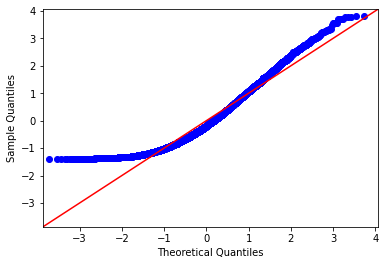

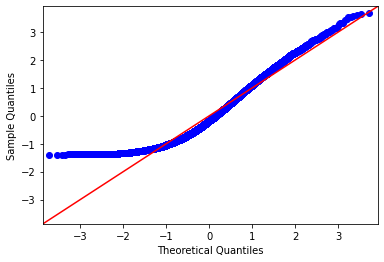

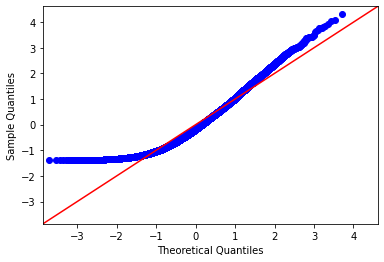

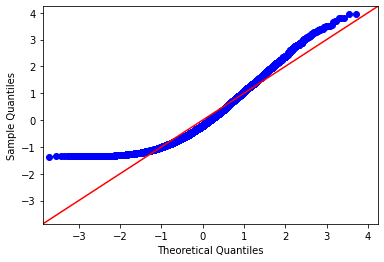

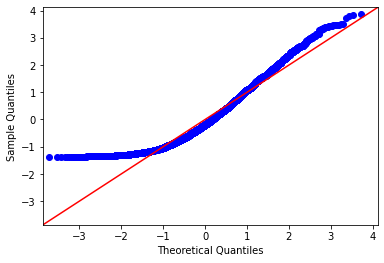

...

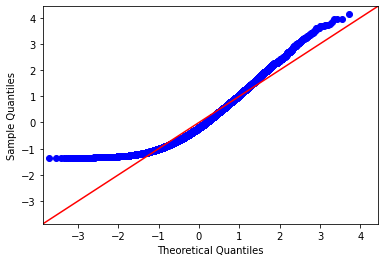

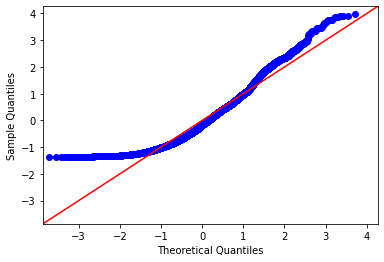

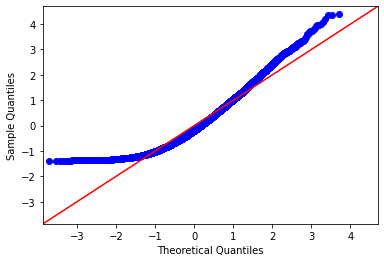

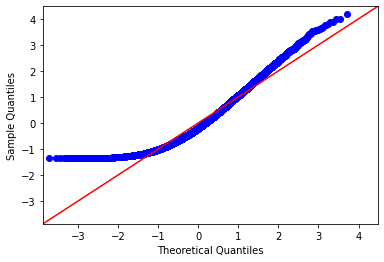

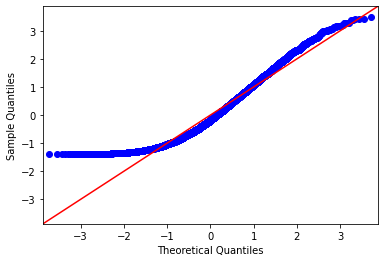

In [11]:
# EXP GENDER PRUEBAS
exp = []
set_X = ["ejecutivo", "gestión", "profesional", "corporación", "salario", "oficina", "negocios", "carrera"]
set_Y = ["hogar", ("padres", "madres"), ("hijos", "hijas"), "familia", ("primos", "primas"), "matrimonio", "boda", "parientes"]
exp.append((set_X, set_Y))
set_X= [("ingenioso", "ingeniosa"), ("curioso", "curiosa"), ("astuto", "astuta"), "perspicaz",
        ("intuitivo", "intuitiva"), ("sensato", "sensata"), ("analítico", "analítica"), ("apto", "apta"), ("imaginativo", "imaginativa"),
        ("sabio", "sabia"), "inteligente", "brillante", ("lógico", "lógica")]
set_Y=[("seductor","seductora"), "doméstico", "sensual", ("hermoso", "hermosa"), ("delgado", "delgada"), ("atlético", "atlética"),
        "moda", ("feo", "fea"), ("guapo", "guapa"), ("sano", "sana"), ("atractivo", "atractiva"), ("gordo", "gorda"),
        ("bonito", "bonita")]
exp.append((set_X, set_Y))
set_X = ["fuerte", "seguridad", "dominante", "potente", "afirmar", ("ruidoso", "ruidosa"), "audaz", "éxito", "triunfo", "líder", "grito", ("ganador", "ganadora")]
set_Y = ["débil", ("rendido", "rendida"), "timidez", "vulnerable", "debilidad", "tenue", "fracaso", "seguir", "perder", "frágil", ("asustado", "asustada"), ("perdedor", "perdedora")]
exp.append((set_X, set_Y))
set_X = ["líder", "profesional", "dinero", ("capitán", "capitana"), ("campeón", "campeona"), "premios", "referente", ("ídola", "ídolo")]
set_Y = [("guapo", "guapa"), ("novio", "novia"), "pareja", "débil", ("bello", "bella"), "derrota", "fracaso", "belleza"]
exp.append((set_X, set_Y))

result = {'Periódico':[],
        'Shapiro':[],
        'Shapiro_p_value':[],
        'Mean_normal': [],
        'Stdev_normal':[],
        'P_value':[]}

embeddings = ["Marca", "As", "Mundo Deportivo"]

for e in embeddings:
    if e == "Marca":
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\marca\sportword2vec.model")
        PATH_VOCAB = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\marca\pipe7-vocab"

    if e == "As":
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\as\AsWord2Vec.model")
        PATH_VOCAB = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\as\As-vocab"

    if e == "Mundo Deportivo":
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\mundoDeportivo\MDWord2Vec.model")
        PATH_VOCAB =  r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\mundoDeportivo\MD-vocab"
    
    for (x, y) in exp:
        res = p_value_weat_gender(x, y, set_A, set_B)
        result["Periódico"].append(e)
        result["Shapiro"].append(res[0])
        result["Shapiro_p_value"].append(res[1])
        result["Mean_normal"].append(res[2])
        result["Stdev_normal"].append(res[3])
        result["P_value"].append(res[4])

excel = pd.DataFrame.from_dict(result)
path = r"C:\Users\marta\OneDrive\Documentos\experimentosTFG"
import os
excel.to_excel(os.path.join(path,r'WEATPvalGenderPeriodicos.xlsx'))
excel

c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  -0.00024781249892483935 

 stdev:  0.25448320063477126 

 partition ass:  [-0.027795613924455398, -0.22445679577584887, 0.09183722902606761, 0.13480654470105136, 0.23708413321421373, -0.029894304694607854, -0.08112943128475703, -0.27523027575160885, 0.5720401775971469, 0.08406575078455114, 0.1398747547581377, -0.13215240538637674, 0.01264837578249478, -0.38440481508668106, 0.2186301819617964, -0.026896841280783068, -0.13700861103522288, 0.5661123152046155, 0.20642678136937326, -0.17062184129220742, 0.07342513487674296, 0.021286510474359033, 0.026051231737559077, -0.046616718147156844, -0.1432425187021079, -0.21813030972973346, -0.04043353465385746, 0.14434945342751848, -0.23910289679446978, 0.0006388654259759097, -0.041862053770778784, -0.11519211921323524, -0.012168294672543989, -0.002711919213955527, -0.3406010142061858, -0.2497615656660248, 0.011162968999188783, 0.3164849908660269, -0.046506128144554015, -0.16025692547878456, -0.05875794007442914, 0.26183741547477735, -0.1935

c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  0.004881198862479588 

 stdev:  0.30085346656818635 

 partition ass:  [-0.03157132873699675, -0.023608163354866596, -0.5349701568031581, 0.4550878859526063, 0.4582318102281229, -0.46988169254554013, -0.11224808809735498, -0.011411508642292123, 0.43152975683592065, 0.2280875063152052, -0.005975170067459956, -0.13594821820475383, 0.0038912684410914444, -0.038262952138514605, -0.264546053231849, 0.1876851784699181, -0.06598000547253624, -0.6462107766354974, -0.45282486101172664, 0.2510691248979938, -0.10340639166921994, -0.282456562459831, 0.08000450826431099, 0.25923633902049104, 0.23542728944448738, 0.3971613555202363, -0.14647098311818102, 0.1823771225301446, -0.3695851871937825, 0.08558006615041652, 0.23128632289849027, 0.18970311599292078, -0.16940945704441723, 0.15927638328867033, 0.2957817741294599, -0.29681605123268034, 0.07037915424573138, -0.1537289640077183, -0.05224265955621388, -0.2136889244882495, 0.45111867533867334, 0.3618320656177173, 0.2248907102750511, 0.3438754

c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  0.00035798127271700686 

 stdev:  0.27880453692407153 

 partition ass:  [0.3101247695869664, 0.4111693818251499, 0.00434793054591881, 0.15343282184201396, -0.13643099138668435, -0.16198367582789314, 0.057278119635561175, -0.2845404193503781, 0.2363690564331288, -0.3265034624815194, -0.1706791843106556, 0.27290999745794875, -0.031651783514664356, -0.24551250018541587, -0.44582882980143446, -0.40991764868764846, 0.16441662259037698, 0.135677190303492, -0.33497615985106666, 0.1516387226551565, 0.44358312257099886, -0.36329668761593187, -0.4397457444962736, 0.15926498814951617, 0.07582263709304643, 0.07849839496581507, 0.09940429403084439, -0.06661225856644004, 0.5841436762905989, -0.07627068792418074, -0.2848552397012504, 0.10685523579983669, -0.2509005086418862, -0.25059746784002834, 0.4188473830905018, -0.02197688795988334, 0.18554341463216895, 0.38008097995124346, 0.41724866298803437, 0.14383841121000124, -0.29212778743304724, 0.2537881429953915, 0.2938383039630328, -0.26844141

c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  0.003886489520929497 

 stdev:  0.26654264264436095 

 partition ass:  [0.451092850950469, -0.15097001736608545, 0.4885354557482061, -0.5064081054847015, -0.15819816905423068, -0.15461968207253257, 0.06534494354531895, 0.22409182661148308, 0.05435814688745366, -0.1700641597821636, 0.20686516518536452, 0.2760256363965001, 0.12080336371501388, 0.03808404690547218, -0.6240315884707442, -0.1684882742346318, -0.21239583042592536, -0.14031362046241858, -0.40595496126075487, -0.06905161073599542, -0.13985121231073416, 0.2906120099586486, -0.046275762857274305, -0.22040652606907907, -0.19235554224643336, -0.12455783296415274, -0.23609302742342064, -0.01971084366798287, 0.15948275713728627, 0.20709101160820048, -0.30066646106166034, -0.09439796512985282, 0.08108642716413472, 0.4665882566057715, -0.2042217357439869, -0.7325842039911852, -0.053207629783880994, -0.2099967686194254, -0.33859169308238446, 0.09663686922997128, 0.10155792276620773, 0.3820504777023516, 0.11019606470815935, 0.204

c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  -0.004897517586644324 

 stdev:  0.3008163997566651 

 partition ass:  [-0.052050297148525715, -0.5734802526421844, -0.007037979498919489, -0.4720411769942276, -0.4550481301007998, 0.14322575119634456, -0.3423766235096587, 0.014702691903544896, -0.12286948216044247, 0.18464143589759868, -0.29924914928981006, -0.38399578066956663, -0.44924768665805453, -0.5984352917617393, 0.04344540767164684, 0.20939991535204983, 0.060727244967387906, 0.2511940034002893, -0.24053294020187532, 0.01617578629197336, -0.19769847072247004, -0.3424588600173594, 0.023685866966843716, -0.2771115090904964, 0.012797732889238356, 0.2634499920532108, 0.22468551884715748, 0.054167189480115896, -0.14556790671000885, 0.33008165134944845, -0.006898553421099907, 0.2127149064197308, -0.18999046237311434, -0.5586750922828085, 0.24542686912334644, 0.5725378868066602, -0.49584659075157494, -0.18341690420897477, 0.2736209353121618, -0.4484364623721275, -0.20060224065350163, 0.34983948550911426, 0.0794896378906238, -0

,Year,Shapiro,Shapiro_p_value,Mean_normal,Stdev_normal,P_value
0,2019,0.999244,1.943745e-04,-0.000248,0.254483,0.179195
1,2019,0.999221,1.419186e-04,-0.000930,0.357266,0.027954
2,2019,0.998153,1.429411e-09,0.000345,0.268875,0.162595
3,2019,0.998719,3.505837e-07,0.004543,0.287695,0.017505
4,2020,0.998722,3.621370e-07,0.004881,0.300853,0.012865
5,2020,0.999468,4.555243e-03,-0.004332,0.366785,0.023885
6,2020,0.997298,1.720099e-12,-0.002055,0.250609,0.646785
7,2020,0.999388,1.420042e-03,0.003960,0.343122,0.007344
8,2021,0.990624,3.948116e-25,0.000358,0.278805,0.065761
9,2021,0.999691,1.241322e-01,-0.004187,0.419959,0.244521


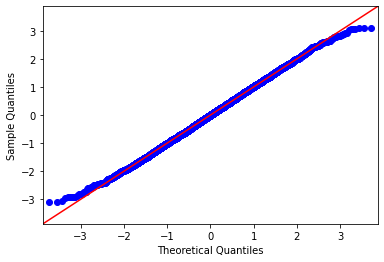

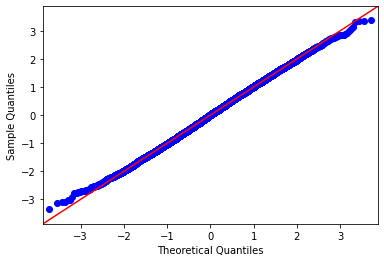

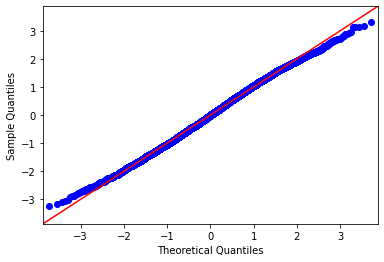

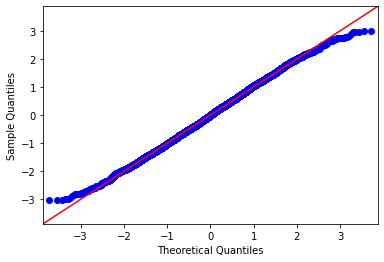

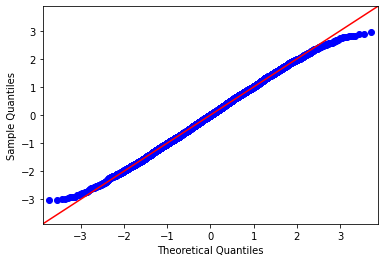

...

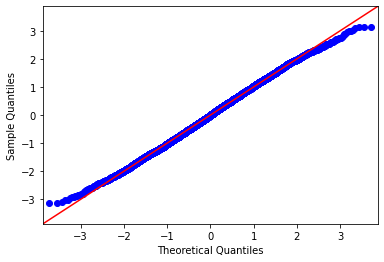

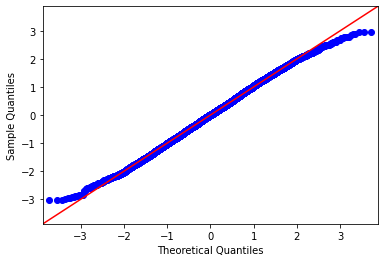

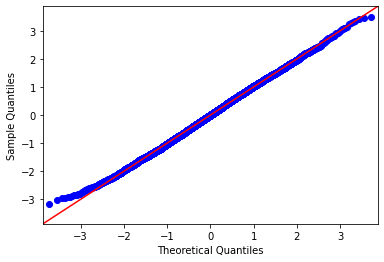

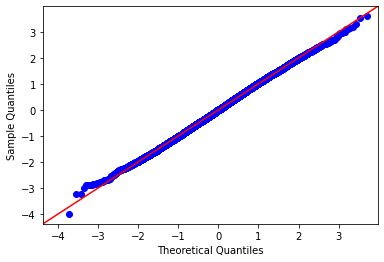

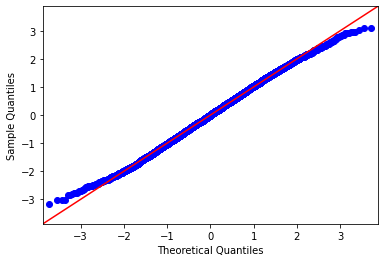

In [16]:
exp = []
set_X = ["ejecutivo", "gestión", "profesional", "corporación", "salario", "oficina", "negocios", "carrera"]
set_Y = ["hogar", "padres", "hijos", "familia", "primos", "matrimonio", "boda", "parientes"]
exp.append((set_X, set_Y))
set_X= ["precoz", "ingenioso", "curioso", "genio", "astuto", "adaptable", "perspicaz", "intuitivo", "sensato", "analítico", "apto", "imaginativo",
        "sabio", "inteligente", "brillante", "lógico"]
set_Y=["seductora", "doméstico", "sensual", "hermosa", "delgada", "atlético", "moda", "corpulento", "feo", "guapo", "sano", "atractivo", "gordo", "delgado", "bonito", "hermoso"]
exp.append((set_X, set_Y))
set_X = ["fuerte", "seguridad", "dominante", "potente", "afirmar", "ruidoso", "audaz", "éxito", "triunfo", "líder", "grito", "ganador"]
set_Y = ["débil", "rendido", "timidez", "vulnerable", "debilidad", "tenue", "fracaso", "seguir", "perder", "frágil", "asustado", "perdedor"]
exp.append((set_X, set_Y))
set_X = ["líder", "profesional", "dinero", "capitán", "campeón", "premios", "referente", "ídolo"]
set_Y = ["guapa", "novia", "pareja", "débil", "bella", "derrota", "fracaso", "belleza"]
exp.append((set_X, set_Y))

result = {'Year':[],
        'Shapiro':[],
        'Shapiro_p_value':[],
        'Mean_normal': [],
        'Stdev_normal':[],
        'P_value':[]}

for i in range(2019, 2024):
    model = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models" +"\ ".strip() +str(i) + "\ ".strip() + "futbolMD" + str(i)+".model"
    w2v_model = Word2Vec.load(model)
    
    for (x, y) in exp:
        res = p_value_weat(x, y, set_A, set_B)
        result["Year"].append(str(i))
        result["Shapiro"].append(res[0])
        result["Shapiro_p_value"].append(res[1])
        result["Mean_normal"].append(res[2])
        result["Stdev_normal"].append(res[3])
        result["P_value"].append(res[4])

excel = pd.DataFrame.from_dict(result)
path = r"C:\Users\marta\OneDrive\Documentos\experimentosTFG"
import os
excel.to_excel(os.path.join(path,r'WEATPvalAños.xlsx'))
excel

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  0.17675816373143396 

 stdev:  0.12960863530432815 

 partition ass:  [0.057149619006344854, 0.1611786405426553, 0.031683685503796744, 0.5041459901646401, 0.17141130997333665, 0.26245476182601923, 0.04206250601499861, 0.3709587062217504, 0.006943056709132978, 0.010677417158149183, 0.13531396691946107, 0.12388264272724181, 0.2712440949787074, 0.33124496175959284, 0.25956072726856083, 0.10833211728216452, 0.08762215004147322, 0.04551954850709705, 0.27489111126245325, 0.22821177481414978, 0.05944234884292299, 0.09788095424624366, 0.1771408159466873, 0.35426996954871975, 0.14888614756313856, 0.10197349706302494, 0.2398630960249447, 0.18697486319837886, 0.06491454601443059, 0.24980157586590723, 0.3415105575824985, 0.052595057563545766, 0.2079885964566427, 0.288600998891828, 0.27677015314758247, 0.014812155122247761, 0.29264503250467666, 0.4511947422417709, 0.4516177012507493, 0.36782124104340475, 0.028519829980925615, 0.0996807672264467, 0.08292373436658329, 0.06170900125936063, 0.06

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  0.17722183603026334 

 stdev:  0.12948100222445305 

 partition ass:  [0.047794319618131076, 0.39634610898145983, 0.2299693448585458, 0.15672524482296357, 0.05464539192487605, 0.039653476359995166, 0.040984186686626956, 0.5027687650160966, 0.02210491356931421, 0.19436608318937953, 0.1996802609323317, 0.12373995656121739, 0.2694532112412463, 0.14856386343146566, 0.10525453884232161, 0.07689395372936925, 0.12507494116693518, 0.3925733353050115, 0.39545593381626526, 0.08291501116602584, 0.09966140265654144, 0.23231305500828758, 0.05509737574417772, 0.2138743170524119, 0.24677311915567968, 0.18279392385415527, 0.33327067104659774, 0.0973222462732034, 0.26051778335305353, 0.39313971056577024, 0.10753234565749559, 0.12512607466972747, 0.039235842187837155, 0.105445998610877, 0.24707124106094436, 0.11264009356576321, 0.21816784383392784, 0.2487412427823681, 0.16774881008313958, 0.08705325198954805, 0.06483126716921117, 0.15892060880368142, 0.18324658589618703, 0.4275721359234819, 0.140

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  0.10639814315523125 

 stdev:  0.07570095234865276 

 partition ass:  [0.06979545644329255, 0.0078384365187959, 0.163109629919442, 0.119253096054308, 0.22232928663854395, 0.12008928775321692, 0.0946172004332767, 0.10222234992155188, 0.17852239539691572, 0.06533942929106873, 0.07308132947784751, 0.13272061285614556, 0.054369804514054376, 0.010511204432178789, 0.1766949904849754, 0.01758913862674183, 0.019385396360626417, 0.18845761178009623, 0.12909335745239836, 0.010097585786651209, 0.18080546317570323, 0.041093085750212976, 0.25056448766392564, 0.2414320706933114, 0.1891262470873899, 0.13731699937488884, 0.12813497255814976, 0.011330824539375728, 0.09113307583094066, 0.28937773218947566, 0.15234898611541015, 0.26304867888231664, 0.11900270196040064, 0.00015610103340202297, 0.03248421781851596, 0.10016557867897469, 0.16411536335686439, 0.11233758467197841, 0.1696843970437638, 0.0416816653450951, 0.10259455213478441, 0.1463646214170795, 0.08793326010668834, 0.16195878390378016, 0

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  0.16520667142990797 

 stdev:  0.12099895761949797 

 partition ass:  [0.11663768420759058, 0.028077687980839983, 0.15893523611399973, 0.3319845740689845, 0.40269424568719436, 0.28840850967228304, 0.0009263953704957695, 0.36681406843126757, 0.015725332535415082, 0.015008116519311332, 0.5637670599228135, 0.27880904266364975, 0.08882541696786772, 0.11488540140433368, 0.11608271374845758, 0.07428703333910869, 0.041694820538395905, 0.13503245377149942, 0.17436472213658927, 0.21171285634692238, 0.27920782503012276, 0.004702858824101708, 0.3884643805633663, 0.02451533276729978, 0.034803065894973395, 0.12893475740565918, 0.025034382043587544, 0.12252621349115433, 0.19829470283002582, 0.2122532635662031, 0.08100266526000466, 0.16028726477007793, 0.2673683888699292, 0.2526257205657506, 0.5939319161795236, 0.12553131724255062, 0.08657619997716737, 0.30735616635259555, 0.1429252495258374, 0.11689603277934824, 0.30505658956179904, 0.527453201606275, 0.044136696918737894, 0.09827661401424048

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
c:\Users\marta\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Mean:  0.18906492532894223 

 stdev:  0.13772088484126052 

 partition ass:  [0.050689621466315504, 0.038168376208179366, 0.23393148489089488, 0.369168857216007, 0.34247443700830127, 0.10817735854329347, 0.03296094641296399, 0.004312243105636604, 0.06749025189007307, 0.05085153474162041, 0.20267305445546901, 0.2998957253682115, 0.09607381223597455, 0.10158159904595887, 0.06032201425275863, 0.45684630465176346, 0.16226078290492274, 0.06037712692179609, 0.04645565426391007, 0.17975719185132122, 0.28996412171464814, 0.2877540549573798, 0.28113333244497574, 0.14412547399600362, 0.4226468287718793, 0.36550541599798536, 0.013459269992179612, 0.12301665772166515, 0.296631251151363, 0.07256259013795185, 0.043858294116540186, 0.37498135471509575, 0.07307811055539393, 0.015600314984719255, 0.22710888900069715, 0.06482034078281806, 0.10864887412430524, 0.26810524855843854, 0.23824352579605268, 0.4394665698831278, 0.14486742899235738, 0.4687674287189212, 0.2535959878005085, 0.025860637167675615, 0

,Year,Shapiro,Shapiro_p_value,Mean_normal,Stdev_normal,P_value
0,2019,0.935506,0.0,0.176758,0.129609,0.422494
1,2019,0.933908,0.0,0.118408,0.088091,0.173710
2,2019,0.954213,0.0,0.152450,0.104558,0.563316
3,2019,0.941854,0.0,0.180769,0.130374,0.820293
4,2020,0.940400,0.0,0.177222,0.129481,0.135583
5,2020,0.946433,0.0,0.143336,0.102237,0.620694
6,2020,0.932985,0.0,0.111671,0.082752,0.805577
7,2020,0.936574,0.0,0.139059,0.101425,0.300654
8,2021,0.945832,0.0,0.106398,0.075701,0.913549
9,2021,0.937600,0.0,0.213456,0.157749,0.884014


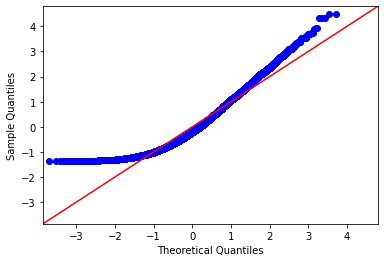

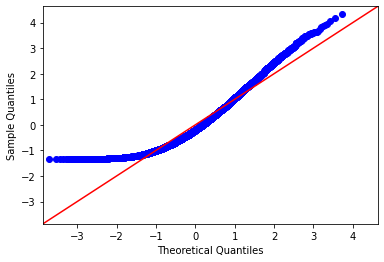

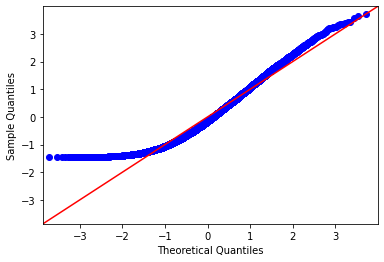

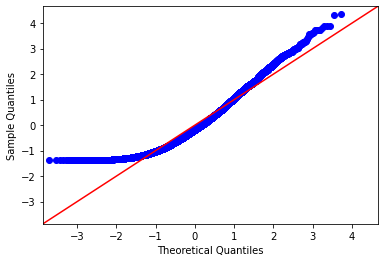

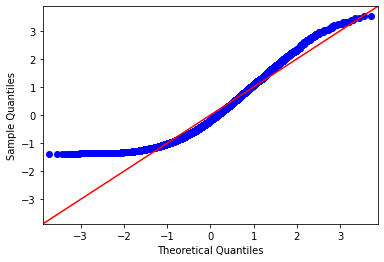

...

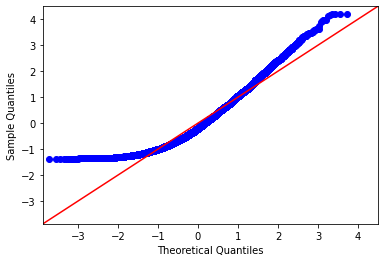

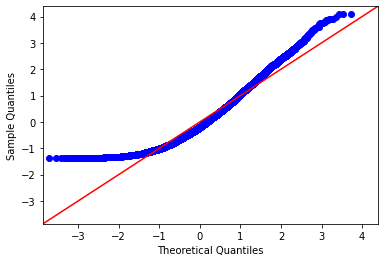

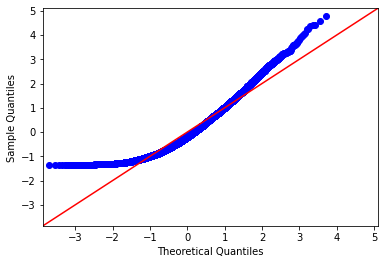

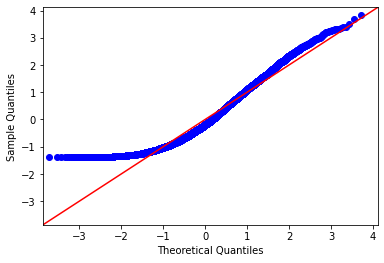

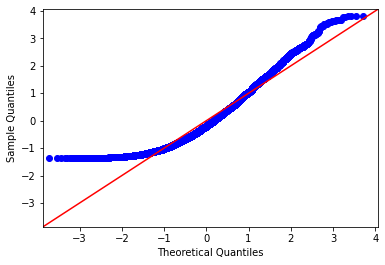

In [17]:
# EXP GENDER PRUEBAS
exp = []
set_X = ["ejecutivo", "gestión", "profesional", "corporación", "salario", "oficina", "negocios", "carrera"]
set_Y = ["hogar", ("padres", "madres"), ("hijos", "hijas"), "familia", ("primos", "primas"), "matrimonio", "boda", "parientes"]
exp.append((set_X, set_Y))
set_X= [("curioso", "curiosa"), "perspicaz",
        ("intuitivo", "intuitiva"), ("analítico", "analítica"), ("apto", "apta"), ("imaginativo", "imaginativa"),
        ("sabio", "sabia"), "inteligente", "brillante", ("lógico", "lógica")]
set_Y=[("hermoso", "hermosa"), ("delgado", "delgada"), ("atlético", "atlética"),
        "moda", ("feo", "fea"), ("guapo", "guapa"), ("sano", "sana"), ("atractivo", "atractiva"), ("gordo", "gorda"),
        ("bonito", "bonita")]
exp.append((set_X, set_Y))
set_X = ["seguridad", "dominante", "potente", "afirmar", ("ruidoso", "ruidosa"), "audaz", "éxito", "triunfo", "líder", "grito", ("ganador", "ganadora")]
set_Y = ["débil", ("rendido", "rendida"), "timidez", "vulnerable", "debilidad", "tenue", "fracaso", "seguir", "perder", "frágil", ("perdedor", "perdedora")]
exp.append((set_X, set_Y))
set_X = ["fuerza", "líder", "profesional", "dinero", ("capitán", "capitana"), ("campeón", "campeona"), "premios", "referente"]
set_Y = [("guapo", "guapa"), ("novio", "novia"), "pareja", "débil", ("bello", "bella"), "derrota", "fracaso", "belleza"]
exp.append((set_X, set_Y))

result = {'Year':[],
        'Shapiro':[],
        'Shapiro_p_value':[],
        'Mean_normal': [],
        'Stdev_normal':[],
        'P_value':[]}

for i in range(2019, 2024):
    model = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models" +"\ ".strip() +str(i) + "\ ".strip() + "futbolMD" + str(i)+".model"
    w2v_model = Word2Vec.load(model)
    
    for (x, y) in exp:
        res = p_value_weat_gender(x, y, set_A, set_B)
        result["Year"].append(str(i))
        result["Shapiro"].append(res[0])
        result["Shapiro_p_value"].append(res[1])
        result["Mean_normal"].append(res[2])
        result["Stdev_normal"].append(res[3])
        result["P_value"].append(res[4])

excel = pd.DataFrame.from_dict(result)
path = r"C:\Users\marta\OneDrive\Documentos\experimentosTFG"
import os
excel.to_excel(os.path.join(path,r'WEATGenderPvalAños.xlsx'))
excel

# WEAT autonomous calculations

### WEAT por periódico

In [19]:
exp = []
set_X = ["ejecutivo", "gestión", "profesional", "corporación", "salario", "oficina", "negocios", "carrera"]
set_Y = ["hogar", "padres", "hijos", "familia", "primos", "matrimonio", "boda", "parientes"]
exp.append((set_X, set_Y))
print(len(set_X))
set_X= ["precoz", "ingenioso", "curioso", "genio", "astuto", "adaptable", "reflexivo", "perspicaz", "intuitivo", "sensato", "analítico", "apto", "venerable", "imaginativo",
        "sabio", "inteligente", "sagaz", "brillante", "lógico"]
set_Y=["seductora", "doméstico", "sensual", "hermosa", "delgada", "calva", "atlético", "moda", "corpulento", "feo", "musculoso", "esbelto", "guapo", "sano", "atractivo", "gordo", "delgado", "bonito", "hermoso"]
exp.append((set_X, set_Y))
print(len(set_Y))
set_X = ["fuerte", "seguridad", "dominante", "potente", "afirmar", "ruidoso", "audaz", "éxito", "triunfo", "líder", "grito", "ganador"]
set_Y = ["débil", "rendido", "timidez", "vulnerable", "debilidad", "tenue", "fracaso", "seguir", "perder", "frágil", "asustado", "perdedor"]
exp.append((set_X, set_Y))
print(len(set_Y))
set_X = ["líder", "profesional", "dinero", "capitán", "campeón", "premios", "referente", "ídolo"]
set_Y = ["guapa", "novia", "pareja", "débil", "bella", "derrota", "fracaso", "belleza"]
exp.append((set_X, set_Y))

result = {'Periódico':[],
        'Effect Size':[],
        'Mean_attr':[],
        'Stdev_attr': []}


for i in range(3):
    if i == 0:
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\marca\sportword2vec.model")
        periodico = "Marca"
    elif i == 1:
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\as\AsWord2Vec.model")
        periodico = "As"
    else:
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\mundoDeportivo\MDWord2Vec.model")
        periodico = "Mundo Deportivo"
    for (x, y) in exp:
        weat = weat_score(x,y,set_A, set_B)
        sign_attr = weat_significance_test_attr(x,y,set_A,set_B)    
        result["Periódico"].append(periodico)
        result["Effect Size"].append(weat)
        result["Mean_attr"].append(np.mean(sign_attr))
        result["Stdev_attr"].append(np.std(sign_attr))

excel = pd.DataFrame.from_dict(result)
excel

8
19
12


,Periódico,Effect Size,Mean_attr,Stdev_attr
0,Marca,1.351023,1.347262,0.047860
1,Marca,0.903801,0.901696,0.018086
2,Marca,0.340589,0.339560,0.029527
3,Marca,1.533660,1.532312,0.022621
4,As,0.339032,0.336538,0.074787
5,As,1.019761,1.016601,0.024016
6,As,0.215403,0.214390,0.039738
7,As,1.444427,1.441545,0.040717
8,Mundo Deportivo,1.473845,1.464755,0.058306
9,Mundo Deportivo,0.945780,0.941150,0.033626


### WEAT por año

In [30]:
exp = []
set_X = ["ejecutivo", "gestión", "profesional", "corporación", "salario", "oficina", "negocios", "carrera"]
set_Y = ["hogar", "padres", "hijos", "familia", "primos", "matrimonio", "boda", "parientes"]
exp.append((set_X, set_Y))
set_X= ["precoz", "ingenioso", "curioso", "genio", "astuto", "adaptable", "perspicaz", "intuitivo", "sensato", "analítico", "apto", "imaginativo",
        "sabio", "inteligente", "brillante", "lógico"]
set_Y=["seductora", "doméstico", "sensual", "hermosa", "delgada", "atlético", "moda", "corpulento", "feo", "guapo", "sano", "atractivo", "gordo", "delgado", "bonito", "hermoso"]
exp.append((set_X, set_Y))
set_X = ["fuerte", "seguridad", "dominante", "potente", "afirmar", "ruidoso", "audaz", "éxito", "triunfo", "líder", "grito", "ganador"]
set_Y = ["débil", "rendido", "timidez", "vulnerable", "debilidad", "tenue", "fracaso", "seguir", "perder", "frágil", "asustado", "perdedor"]
exp.append((set_X, set_Y))
set_X = ["líder", "profesional", "dinero", "capitán", "campeón", "premios", "referente", "ídolo"]
set_Y = ["guapa", "novia", "pareja", "débil", "bella", "derrota", "fracaso", "belleza"]
exp.append((set_X, set_Y))

result = {'2019':[],
        'MeanAttr2019':[],
        'StdevAttr2019':[],
        '2020':[],
        'MeanAttr2020':[],
        'StdevAttr2020':[],
        '2021':[],
        'MeanAttr2021':[],
        'StdevAttr2021':[],
        '2022':[],
        'MeanAttr2022':[],
        'StdevAttr2022':[],
        '2023':[],
        'MeanAttr2023':[],
        'StdevAttr2023':[]}

init = 2019
model = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models" +"\ ".strip() +str(init) + "\ ".strip() + "futbol" + str(init)+".model"
print(model)

for i in range(2019, 2024):
    model = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models" +"\ ".strip() +str(i) + "\ ".strip() + "futbolMD" + str(i)+".model"
    w2v_model = Word2Vec.load(model)

    for (x, y) in exp:
        weat = weat_score(x,y,set_A, set_B)
        sign_attr = weat_significance_test_attr(x,y,set_A,set_B)    
        result[str(i)].append(weat)
        result["MeanAttr"+str(i)].append(np.mean(sign_attr))
        result["StdevAttr"+str(i)].append(np.std(sign_attr))

excel = pd.DataFrame.from_dict(result)
path = r"C:\Users\marta\OneDrive\Documentos\experimentosTFG"
import os
excel.to_excel(os.path.join(path,r'WEATtemporal.xlsx'))


C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\2019\futbol2019.model


### WEAT Gender por periódico

In [36]:
# EXP GENDER PRUEBAS
exp = []
set_X = ["ejecutivo", "gestión", "profesional", "corporación", "salario", "oficina", "negocios", "carrera"]
set_Y = ["hogar", ("padres", "madres"), ("hijos", "hijas"), "familia", ("primos", "primas"), "matrimonio", "boda", "parientes"]
exp.append((set_X, set_Y))
set_X= [("ingenioso", "ingeniosa"), ("curioso", "curiosa"), ("astuto", "astuta"), "perspicaz",
        ("intuitivo", "intuitiva"), ("sensato", "sensata"), ("analítico", "analítica"), ("apto", "apta"), ("imaginativo", "imaginativa"),
        ("sabio", "sabia"), "inteligente", "brillante", ("lógico", "lógica")]
set_Y=[("seductor","seductora"), "doméstico", "sensual", ("hermoso", "hermosa"), ("delgado", "delgada"), ("atlético", "atlética"),
        "moda", ("feo", "fea"), ("guapo", "guapa"), ("sano", "sana"), ("atractivo", "atractiva"), ("gordo", "gorda"),
        ("bonito", "bonita")]
exp.append((set_X, set_Y))
set_X = ["fuerte", "seguridad", "dominante", "potente", "afirmar", ("ruidoso", "ruidosa"), "audaz", "éxito", "triunfo", "líder", "grito", ("ganador", "ganadora")]
set_Y = ["débil", ("rendido", "rendida"), "timidez", "vulnerable", "debilidad", "tenue", "fracaso", "seguir", "perder", "frágil", ("asustado", "asustada"), ("perdedor", "perdedora")]
exp.append((set_X, set_Y))
set_X = ["líder", "profesional", "dinero", ("capitán", "capitana"), ("campeón", "campeona"), "premios", "referente", ("ídolo", "ídola")]
set_Y = [("guapo", "guapa"), ("novio", "novia"), "pareja", "débil", ("bello", "bella"), "derrota", "fracaso", "belleza"]
exp.append((set_X, set_Y))

#se quita genio-genia, corpulento-corpulenta pq no estan en el set. Para igualar tamaño de conjuntos, se quita precoz y adaptable (primeras palabras neutras q habia)
result = {'Periódico':[],
        'Effect Size':[],
        'Mean':[],
        'Stdev': []}


for i in range(3):
    if i == 0:
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\marca\sportword2vec.model")
        periodico = "Marca"
    elif i == 1:
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\as\AsWord2Vec.model")
        periodico = "As"
    else:
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\mundoDeportivo\MDWord2Vec.model")
        periodico = "Mundo Deportivo"
    for (x, y) in exp:
        weat = weat_score_gender(x,y,set_A, set_B)
        sign = weat_significance_test_gender_attr(x,y,set_A,set_B)  

        result["Periódico"].append(periodico)
        result["Effect Size"].append(weat)
        result["Mean"].append(np.mean(sign))
        result["Stdev"].append(np.std(sign))

excel = pd.DataFrame.from_dict(result)
excel

,Periódico,Effect Size,Mean,Stdev
0,Marca,-1.220940,-1.206210,0.134818
1,Marca,-0.599066,-0.610663,0.068139
2,Marca,-0.080808,-0.105996,0.056744
3,Marca,-0.278970,-0.296279,0.097128
4,As,-0.528527,-0.530753,0.036823
5,As,0.695931,0.673474,0.070144
6,As,-0.291691,-0.329216,0.097915
7,As,-0.552644,-0.512397,0.228733
8,Mundo Deportivo,-1.166434,-1.141772,0.139010
9,Mundo Deportivo,1.158557,1.106988,0.091681


### WEAT gender por año

In [38]:
# EXP GENDER PRUEBAS
exp = []
set_X = ["ejecutivo", "gestión", "profesional", "corporación", "salario", "oficina", "negocios", "carrera"]
set_Y = ["hogar", ("padres", "madres"), ("hijos", "hijas"), "familia", ("primos", "primas"), "matrimonio", "boda", "parientes"]
exp.append((set_X, set_Y))
set_X= [("curioso", "curiosa"), "perspicaz",
        ("intuitivo", "intuitiva"), ("analítico", "analítica"), ("apto", "apta"), ("imaginativo", "imaginativa"),
        ("sabio", "sabia"), "inteligente", "brillante", ("lógico", "lógica")]
set_Y=[("hermoso", "hermosa"), ("delgado", "delgada"), ("atlético", "atlética"),
        "moda", ("feo", "fea"), ("guapo", "guapa"), ("sano", "sana"), ("atractivo", "atractiva"), ("gordo", "gorda"),
        ("bonito", "bonita")]
exp.append((set_X, set_Y))
set_X = ["seguridad", "dominante", "potente", "afirmar", ("ruidoso", "ruidosa"), "audaz", "éxito", "triunfo", "líder", "grito", ("ganador", "ganadora")]
set_Y = ["débil", ("rendido", "rendida"), "timidez", "vulnerable", "debilidad", "tenue", "fracaso", "seguir", "perder", "frágil", ("perdedor", "perdedora")]
exp.append((set_X, set_Y))
set_X = ["fuerza", "líder", "profesional", "dinero", ("capitán", "capitana"), ("campeón", "campeona"), "premios", "referente"]
set_Y = [("guapo", "guapa"), ("novio", "novia"), "pareja", "débil", ("bello", "bella"), "derrota", "fracaso", "belleza"]
exp.append((set_X, set_Y))
result = {'2019':[],
        'Mean2019':[],
        'Stdev2019':[],
        '2020':[],
        'Mean2020':[],
        'Stdev2020':[],
        '2021':[],
        'Mean2021':[],
        'Stdev2021':[],
        '2022':[],
        'Mean2022':[],
        'Stdev2022':[],
        '2023':[],
        'Mean2023':[],
        'Stdev2023':[]}

for i in range(2019, 2024):
    model = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models" +"\ ".strip() +str(i) + "\ ".strip() + "futbolMD" + str(i)+".model"
    w2v_model = Word2Vec.load(model)

    for (x, y) in exp:
        weat = weat_score_gender(x,y,set_A, set_B)
        sign = weat_significance_test_gender_attr(x,y,set_A,set_B)
    
        result[str(i)].append(weat)
        result["Mean"+str(i)].append(np.mean(sign))
        result["Stdev"+str(i)].append(np.std(sign))

excel = pd.DataFrame.from_dict(result)
path = r"C:\Users\marta\OneDrive\Documentos\experimentosTFG"
import os
excel.to_excel(os.path.join(path,r'WEATGenderTemporal.xlsx'))


# SAME

In [21]:
#------------ SAME ------------
# los conjuntos A y B son los mismos que el subespacio de género
set_A = [ male_word for (female_word, male_word) in ES_defs]
set_B = [ female_word for (female_word, male_word) in ES_defs]

def normalize_set(x):
    x = [w2v_model.wv[w] / np.linalg.norm(w2v_model.wv[w]) for w in x]
    return x

def individual_bias_SAME(w, A, B):
    a_i =  (1/len(A)) * sum(A)
    b_i =  (1/len(B)) * sum(B)
    normalize_w = w2v_model.wv[w] / np.linalg.norm(w2v_model.wv[w])
    denominator = a_i - b_i
    denominator = denominator / np.linalg.norm(denominator)

    return np.dot(normalize_w, denominator)

def metric_SAME(W, A, B):
    individual_bias = []
    A = normalize_set(A)
    B = normalize_set(B)
    res = 0
    # take mean absolute of individual bias
    for word in W:
        res += individual_bias_SAME(word, A, B)
        individual_bias.append((word, individual_bias_SAME(word, A, B)))
    return individual_bias, (1 / len(W)) * res

def SAME_significance_test(w, set_A, set_B):
    res = []
    for i in range(len(set_A)):
        # sacar 1a palabra de los sets
        del_A = set_A.pop(0)
        del_B = set_B.pop(0)
        # experimento
        res.append(metric_SAME(w,set_A,set_B)[-1])
        # devolver elemento eliminado
        set_A.append(del_A)
        set_B.append(del_B)
    return np.array(res)

# SAME automatic tests

In [29]:
exp = []
set_X = ["ejecutivo", "gestión", "profesional", "corporación", "salario", "oficina", "negocios", "carrera"]
set_Y = ["hogar", "padres", "hijos", "familia", "primos", "matrimonio", "boda", "parientes"]
exp.append((set_X, set_Y))
set_X= ["precoz", "ingenioso", "curioso", "genio", "astuto", "adaptable", "perspicaz", "intuitivo", "sensato", "analítico", "apto", "imaginativo",
        "sabio", "inteligente", "brillante", "lógico"]
set_Y=["seductora", "doméstico", "sensual", "hermosa", "delgada", "atlético", "moda", "corpulento", "feo", "guapo", "sano", "atractivo", "gordo", "delgado", "bonito", "hermoso"]
exp.append((set_X, set_Y))
set_X = ["fuerte", "seguridad", "dominante", "potente", "afirmar", "ruidoso", "audaz", "éxito", "triunfo", "líder", "grito", "ganador"]
set_Y = ["débil", "rendido", "timidez", "vulnerable", "debilidad", "tenue", "fracaso", "seguir", "perder", "frágil", "asustado", "perdedor"]
exp.append((set_X, set_Y))
set_X = ["líder", "profesional", "dinero", "capitán", "campeón", "premios", "referente", "ídolo"]
set_Y = ["guapa", "novia", "pareja", "débil", "bella", "derrota", "fracaso", "belleza"]
exp.append((set_X, set_Y))

result = {'2019':[],
        'Mean2019':[],
        'Stdev2019':[],
        '2020':[],
        'Mean2020':[],
        'Stdev2020':[],
        '2021':[],
        'Mean2021':[],
        'Stdev2021':[],
        '2022':[],
        'Mean2022':[],
        'Stdev2022':[],
        '2023':[],
        'Mean2023':[],
        'Stdev2023':[]}

init = 2019
model = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models" +"\ ".strip() +str(init) + "\ ".strip() + "futbol" + str(init)+".model"
print(model)

for i in range(2019, 2024):
    model = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models" +"\ ".strip() +str(i) + "\ ".strip() + "futbolMD" + str(i)+".model"
    w2v_model = Word2Vec.load(model)

    for (x, y) in exp:
        same = metric_SAME(x,set_A, set_B)[1]
        sign = SAME_significance_test(x,set_A,set_B)
        result[str(i)].append(same)
        result["Mean"+str(i)].append(np.mean(sign))
        result["Stdev"+str(i)].append(np.std(sign))
        same = metric_SAME(y, set_A, set_B)[1]
        sign = SAME_significance_test(y ,set_A,set_B)
        result[str(i)].append(same)
        result["Mean"+str(i)].append(np.mean(sign))
        result["Stdev"+str(i)].append(np.std(sign))

excel = pd.DataFrame.from_dict(result)
path = r"C:\Users\marta\OneDrive\Documentos\experimentosTFG"
import os
excel.to_excel(os.path.join(path,r'SAMEtemporal.xlsx'))


C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\2019\futbol2019.model


In [27]:
exp = []
set_X = ["ejecutivo", "gestión", "profesional", "corporación", "salario", "oficina", "negocios", "carrera"]
set_Y = ["hogar", "padres", "hijos", "familia", "primos", "matrimonio", "boda", "parientes"]
exp.append((set_X, set_Y))
set_X= ["precoz", "ingenioso", "curioso", "genio", "astuto", "adaptable", "perspicaz", "intuitivo", "sensato", "analítico", "apto", "imaginativo",
        "sabio", "inteligente", "brillante", "lógico"]
set_Y=["seductora", "doméstico", "sensual", "hermosa", "delgada", "atlético", "moda", "corpulento", "feo", "guapo", "sano", "atractivo", "gordo", "delgado", "bonito", "hermoso"]
exp.append((set_X, set_Y))
set_X = ["fuerte", "seguridad", "dominante", "potente", "afirmar", "ruidoso", "audaz", "éxito", "triunfo", "líder", "grito", "ganador"]
set_Y = ["débil", "rendido", "timidez", "vulnerable", "debilidad", "tenue", "fracaso", "seguir", "perder", "frágil", "asustado", "perdedor"]
exp.append((set_X, set_Y))
set_X = ["líder", "profesional", "dinero", "capitán", "campeón", "premios", "referente", "ídolo"]
set_Y = ["guapa", "novia", "pareja", "débil", "bella", "derrota", "fracaso", "belleza"]
exp.append((set_X, set_Y))

result = {'Periódico':[],
        'SAME':[],
        'Mean':[],
        'Stdev': []}


for i in range(3):
    if i == 0:
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\marca\sportword2vec.model")
        periodico = "Marca"
    elif i == 1:
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\as\AsWord2Vec.model")
        periodico = "As"
    else:
        w2v_model = Word2Vec.load(r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\models\mundoDeportivo\MDWord2Vec.model")
        periodico = "Mundo Deportivo"
    for (x, y) in exp:
        same = metric_SAME(x,set_A, set_B)[1]
        sign = SAME_significance_test(x,set_A,set_B)
        result["Periódico"].append(periodico)
        result["SAME"].append(same)
        result["Mean"].append(np.mean(sign))
        result["Stdev"].append(np.std(sign))

        same = metric_SAME(y, set_A, set_B)[1]
        sign = SAME_significance_test(y ,set_A,set_B)
        result["SAME"].append(same)
        result["Periódico"].append(periodico)
        result["Mean"].append(np.mean(sign))
        result["Stdev"].append(np.std(sign))

excel = pd.DataFrame.from_dict(result)
excel

,Periódico,SAME,Mean,Stdev
0,Marca,0.012337,0.012054,0.009091
1,Marca,-0.193405,-0.192078,0.008996
2,Marca,0.139797,0.138675,0.006498
3,Marca,-0.035987,-0.035847,0.004802
4,Marca,0.090411,0.089557,0.008815
5,Marca,0.047197,0.046640,0.010520
6,Marca,0.206063,0.204295,0.012222
7,Marca,-0.174399,-0.173245,0.005160
8,As,-0.024192,-0.024009,0.008452
9,As,-0.063127,-0.062512,0.008009


# Disentangling grammatical gender.
https://github.com/shivaomrani/GG_Disentangling

In [39]:

import io
import numpy as np
from sklearn.model_selection import cross_val_score, KFold

### Load femenine and masculine words for the SVC 

In [4]:
expanded_m_nouns = []
expanded_f_nouns = []
count = 0
lang = "es"
pth1 = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\analysis\nouns\es-masc-v2.txt"

with open(pth1, "r") as f:
    for line in f:
        word_raw = line.strip()
        if word_raw not in expanded_m_nouns:
            if word_raw in w2v_model.wv.index_to_key:
                expanded_m_nouns.append(word_raw)
                

print("size of total masculine nouns")
print(len(expanded_m_nouns))

pth1 = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\analysis\nouns\es-fem-v2.txt"
with open(pth1, "r") as f:
    for line in f:
        word_raw = line.strip()
        if word_raw not in expanded_f_nouns:   
            if word_raw in w2v_model.wv.index_to_key:
                expanded_f_nouns.append(word_raw)

print("size of total feminine nouns")
print(len(expanded_f_nouns))

#pairing them for easier processing (not semantically paired)
grammar_pair_expanded = []
for f,m in zip(expanded_f_nouns, expanded_m_nouns):
    pair = [f,m]
    grammar_pair_expanded.append(pair)

print("size of masculine and feminine nouns (made equal)")
len(grammar_pair_expanded)

size of total masculine nouns
4180
size of total feminine nouns
3224
size of masculine and feminine nouns (made equal)


3224

### Train SVC

In [16]:
from sklearn.svm import LinearSVC
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import normalize #machine learning algorithm library


clf_kfold = LinearSVC()
#selecting 3,000 feminine and 3,000 masculine nouns for learning the grammatical gender subspace
shortened_3000 = grammar_pair_expanded[:2579]



#selecting another subset for testing.
rest = grammar_pair_expanded[2579:6000]
X_rest = np.zeros((len(rest)*2, 100))

counter = 0
for pair in rest:
    X_rest[counter] = w2v_model.wv[pair[0]]
    counter += 1
    X_rest[counter] = w2v_model.wv[pair[1]]
    counter += 1
    
#normalizing the embeddings
X_rest=normalize(X_rest,axis=0)
print(len(X_rest))
#creating gender labels
y_rest = np.tile([1,2],len(rest))

1290


Slight modification of the original code. They use 3000 experiments for training and the rest for testing, but in our embedding we only have 3224 pairs of words in the vocablary. Thus we do an 80-20 train-test-split, using 2579 pairs for training and leaving the rest for testing.

In [15]:
from statistics import mean

test_accur = []
train_accur = []

X_3000 = np.zeros((5158, 100))

counter = 0
for pair in shortened_3000:
    X_3000[counter] = w2v_model.wv[pair[0]]
    counter += 1
    X_3000[counter] = w2v_model.wv[pair[1]]
    counter += 1
    

#normalizing the embeddings
X_3000=normalize(X_3000,axis=0)

#creating gender labels
y_3000 = np.tile([1,2],2579)

clf_3000 = LinearSVC(C = 10)
clf_3000.fit(X_3000, y_3000)
acc = clf_3000.score(X_3000,y_3000)
print("Initial classification accuracy is", acc)

acc1 = clf_3000.score(X_rest,y_rest)
print("test classification accuracy is", acc1)

test_accur.append(acc1)
train_accur.append(acc)

#selecting the decision hyperplane as the grammatical gender signal
coef = clf_3000.coef_
grammar_gender_direction_3000 = np.reshape(coef/np.linalg.norm(coef), (100,))
gg = np.reshape(coef/np.linalg.norm(coef), (100,))

Initial classification accuracy is 0.8290034897246995
test classification accuracy is 0.7302325581395349


c:\Users\marta\Anaconda3\lib\site-packages\sklearn\linear_model\base.py:291: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  indices = (scores > 0).astype(np.int)
c:\Users\marta\Anaconda3\lib\site-packages\sklearn\linear_model\base.py:291: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, 

### Test how many iterations are needed to reduce the accuracy to 50%

In [17]:
import numpy as np
from numpy import linalg as LA


#function for projecting out 
def drop(u, v):
    return u - v * u.dot(v) / v.dot(v)
    # didn't use this, but should be the same as above return u - ((v * u.dot(v)) / (v.dot(v)))

In [19]:

from statistics import mean
import warnings
warnings.filterwarnings('ignore')
WEAT_gender_removed_embeddings_2 = np.zeros((len(w2v_model.wv.index_to_key),100))
num_iter = 10
train_accur = []
test_accur = []

# initially, load original w2v model and copy it into WEAT_gender_removed_embeddings_2
for i in range(len(w2v_model.wv.key_to_index.keys())):
    WEAT_gender_removed_embeddings_2[i] = w2v_model.wv[i]

for j in range(num_iter):
    print("iteration number ", j+1, "\n")

    #projecting out grammatical gender for all of words
    for word in w2v_model.wv.key_to_index.keys():
        # get curr vector
        word_emb = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[word]]
        # replace with dropped vector
        WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[word]] = drop(u=word_emb, v=grammar_gender_direction_3000)        


    X_3000_after = np.zeros((5158, 100))
    y_3000_after = np.tile([1,2],2579)
    counter = 0
    #obtaining new embeddings for inanimate nouns
    for pair in shortened_3000:
        X_3000_after[counter] = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[pair[0]]]
        counter += 1
        X_3000_after[counter] = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[pair[1]]]
        counter += 1
    
    X_rest_after = np.zeros((5158, 100))
    y_rest_after = np.tile([1,2],2579)
    counter = 0
    #obtaining new embeddings for test nouns
    for pair in rest:
        X_rest_after[counter] = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[pair[0]]]
        counter += 1
        X_rest_after[counter] = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[pair[1]]]
        counter += 1
    
    #training SVC to learn grammatical gender hyperplane
    clf_3000_after = LinearSVC(C = 10)
    clf_3000_after.fit(X_3000_after, y_3000_after)
    
    accuracy = clf_3000_after.score(X_3000_after,y_3000_after)
    print("accuracy after gender removal is", accuracy)
    train_accur.append(accuracy)
    
    acc1 =  clf_3000_after.score(X_rest_after,y_rest_after)
    print("test classification accuracy is", acc1)
    test_accur.append(acc1)
    
    #obtaining the new hyperplane
    coef_after = clf_3000_after.coef_
    grammar_gender_direction_3000= np.reshape(coef_after/np.linalg.norm(coef_after), (100,))
    
    print("*********************")

iteration number  1 

accuracy after gender removal is 0.5379992245056223
test classification accuracy is 0.5073671965878247
*********************
iteration number  2 

accuracy after gender removal is 0.5397440868553703
test classification accuracy is 0.5069794493989919
*********************
iteration number  3 

accuracy after gender removal is 0.5188057386583947
test classification accuracy is 0.5025203567274137
*********************
iteration number  4 

accuracy after gender removal is 0.518030244280729
test classification accuracy is 0.5013571151609151
*********************
iteration number  5 

accuracy after gender removal is 0.52287708414114
test classification accuracy is 0.5042652190771617
*********************
iteration number  6 

accuracy after gender removal is 0.5126017836370687
test classification accuracy is 0.5104691740984878
*********************
iteration number  7 

accuracy after gender removal is 0.5205506010081427
test classification accuracy is 0.5003877471888

11
10
[0.5073671965878247, 0.5069794493989919, 0.5025203567274137, 0.5013571151609151, 0.5042652190771617, 0.5104691740984878, 0.5003877471888328, 0.4986428848390849, 0.5042652190771617, 0.5034897246994959]


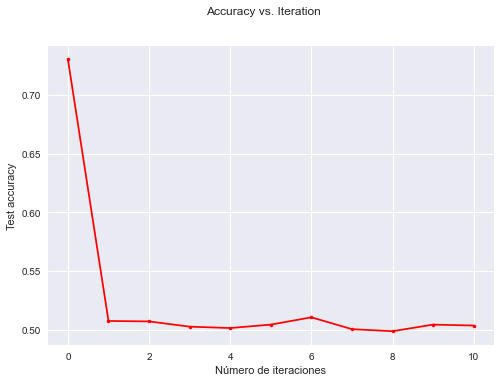

In [48]:
iterations = []
for i in range((num_iter+1)):
    iterations.append(i)
plt.style.use("seaborn")
print(len(iterations))
print(len(test_accur))
plt.plot(iterations,[0.7302325581395349]+ test_accur, '.r-')
plt.xlabel("Número de iteraciones")
plt.ylabel("Test accuracy")
plt.suptitle("Accuracy vs. Iteration")
print(test_accur)

In [49]:

from statistics import mean
import warnings
warnings.filterwarnings('ignore')
WEAT_gender_removed_embeddings_2 = np.zeros((len(w2v_model.wv.index_to_key),100))
num_iter = 3
train_accur = []
test_accur = []

# initially, load original w2v model and copy it into WEAT_gender_removed_embeddings_2
for i in range(len(w2v_model.wv.key_to_index.keys())):
    WEAT_gender_removed_embeddings_2[i] = w2v_model.wv[i]

for j in range(num_iter):
    print("iteration number ", j+1, "\n")

    #projecting out grammatical gender for all of words
    for word in w2v_model.wv.key_to_index.keys():
        # get curr vector
        word_emb = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[word]]
        # replace with dropped vector
        WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[word]] = drop(u=word_emb, v=grammar_gender_direction_3000)        


    X_3000_after = np.zeros((5158, 100))
    y_3000_after = np.tile([1,2],2579)
    counter = 0
    #obtaining new embeddings for inanimate nouns
    for pair in shortened_3000:
        X_3000_after[counter] = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[pair[0]]]
        counter += 1
        X_3000_after[counter] = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[pair[1]]]
        counter += 1
    
    X_rest_after = np.zeros((5158, 100))
    y_rest_after = np.tile([1,2],2579)
    counter = 0
    #obtaining new embeddings for test nouns
    for pair in rest:
        X_rest_after[counter] = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[pair[0]]]
        counter += 1
        X_rest_after[counter] = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[pair[1]]]
        counter += 1
    
    #training SVC to learn grammatical gender hyperplane
    clf_3000_after = LinearSVC(C = 10)
    clf_3000_after.fit(X_3000_after, y_3000_after)
    
    accuracy = clf_3000_after.score(X_3000_after,y_3000_after)
    print("accuracy after gender removal is", accuracy)
    train_accur.append(accuracy)
    
    acc1 =  clf_3000_after.score(X_rest_after,y_rest_after)
    print("test classification accuracy is", acc1)
    test_accur.append(acc1)
    
    #obtaining the new hyperplane
    coef_after = clf_3000_after.coef_
    grammar_gender_direction_3000= np.reshape(coef_after/np.linalg.norm(coef_after), (100,))
    
    print("*********************")

iteration number  1 

accuracy after gender removal is 0.7725862737495153
test classification accuracy is 0.5492438929817759
*********************
iteration number  2 

accuracy after gender removal is 0.6432725862737495
test classification accuracy is 0.5232648313299728
*********************
iteration number  3 

accuracy after gender removal is 0.5990694067468011
test classification accuracy is 0.5143466459868166
*********************


In [54]:
exp = []
set_X = ["ejecutivo", "gestión", "profesional", "corporación", "salario", "oficina", "negocios", "carrera"]
set_Y = ["hogar", "padres", "hijos", "familia", "primos", "matrimonio", "boda", "parientes"]
exp.append((set_X, set_Y))
print(len(set_X))
set_X= ["precoz", "ingenioso", "curioso", "genio", "astuto", "adaptable", "reflexivo", "perspicaz", "intuitivo", "sensato", "analítico", "apto", "venerable", "imaginativo",
        "sabio", "inteligente", "sagaz", "brillante", "lógico"]
set_Y=["seductora", "doméstico", "sensual", "hermosa", "delgada", "calva", "atlético", "moda", "corpulento", "feo", "musculoso", "esbelto", "guapo", "sano", "atractivo", "gordo", "delgado", "bonito", "hermoso"]
exp.append((set_X, set_Y))
print(len(set_Y))
set_X = ["fuerte", "seguridad", "dominante", "potente", "afirmar", "ruidoso", "audaz", "éxito", "triunfo", "líder", "grito", "ganador"]
set_Y = ["débil", "rendido", "timidez", "vulnerable", "debilidad", "tenue", "fracaso", "seguir", "perder", "frágil", "asustado", "perdedor"]
exp.append((set_X, set_Y))
print(len(set_Y))
set_X = ["líder", "profesional", "dinero", "capitán", "campeón", "premios", "referente", "ídolo"]
set_Y = ["guapa", "novia", "pareja", "débil", "bella", "derrota", "fracaso", "belleza"]
exp.append((set_X, set_Y))

set_A = [ male_word for (female_word, male_word) in ES_defs]
set_B = [ female_word for (female_word, male_word) in ES_defs]

def cos_sim(emb1, emb2):
    return((emb1/np.linalg.norm(emb1)).dot(emb2/np.linalg.norm(emb2)))

def word_individual_bias_disentangle(word, A, B):
    n = len(A)
    b1 = 0
    b2 = 0
    emb_word = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[word]]
    for w in A:
        emb_w = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[w]]
        b1 += cos_sim(emb_w, emb_word)
    for w in B:
        emb_w = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[w]]
        b2 += cos_sim(emb_w, emb_word)
    return b1/n - b2/n


''' Computes weat score given sets X, Y, A, B'''
def weat_score_disentangle(X, Y, A, B):
    resX = [word_individual_bias_disentangle(word, A, B) for word in X]
    resY = [word_individual_bias_disentangle(word, A, B) for word in Y]
    #return sum(resX) - sum(resY) 
    # segun un vid de youtube este es el weat SCORE https://www.youtube.com/watch?v=eTenkUPsjko&ab_channel=AIAnytime
    return (np.mean(resX)-np.mean(resY)) / np.std(resX+resY)

result = {
        'Effect Size':[]}
for (x, y) in exp:
    weat = weat_score_disentangle(x,y,set_A, set_B)  
    result["Effect Size"].append(weat)

excel = pd.DataFrame.from_dict(result)
excel

8
19
12


,Effect Size
0,1.446486
1,0.859956
2,0.251762
3,1.474099


In [55]:
#------------ SAME ------------
# los conjuntos A y B son los mismos que el subespacio de género
set_A = [ male_word for (female_word, male_word) in ES_defs]
set_B = [ female_word for (female_word, male_word) in ES_defs]

def normalize_set(x):
    x = [WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[w]] / np.linalg.norm(WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[w]]) for w in x]
    return x

def individual_bias_SAME(w, A, B):
    a_i =  (1/len(A)) * sum(A)
    b_i =  (1/len(B)) * sum(B)
    normalize_w = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[w]] / np.linalg.norm(WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[w]])
    denominator = a_i - b_i
    denominator = denominator / np.linalg.norm(denominator)

    return np.dot(normalize_w, denominator)

def metric_SAME(W, A, B):
    individual_bias = []
    A = normalize_set(A)
    B = normalize_set(B)
    res = 0
    # take mean absolute of individual bias
    for word in W:
        res += individual_bias_SAME(word, A, B)
        individual_bias.append((word, individual_bias_SAME(word, A, B)))
    return individual_bias, (1 / len(W)) * res

def SAME_significance_test(w, set_A, set_B):
    res = []
    for i in range(len(set_A)):
        # sacar 1a palabra de los sets
        del_A = set_A.pop(0)
        del_B = set_B.pop(0)
        # experimento
        res.append(metric_SAME(w,set_A,set_B)[-1])
        # devolver elemento eliminado
        set_A.append(del_A)
        set_B.append(del_B)
    return np.array(res)

In [58]:
for (x, y) in exp:
    same = metric_SAME(x,set_A, set_B)[1]
    print(same)
    same = metric_SAME(y, set_A, set_B)[1]
    print(same)
    print(np.std(SAME_significance_test(x, set_A, set_B)))
    print(np.std(SAME_significance_test(y, set_A, set_B)))
    print("****************")

0.014625127718635889
-0.2527490500265941
0.010025238174159271
0.010369862523106262
****************
0.10192661640265605
-0.0351366190754478
0.006147225012323332
0.0039243243243362366
****************
0.078977168599035
0.0451431604649621
0.010166454817839381
0.012075313266826492
****************
0.19054586872476914
-0.16944415022484666
0.013813165199621948
0.005590710043126256
****************


# Solving analogy tasks before and after disentanglement
To show if semantic explainability is lost or maintained after disentanglement

In [50]:
def solve_analogy(word_1, word_2, word_3, word_4, type, K=10):
    word2id = w2v_model.wv.key_to_index
    id2word = w2v_model.wv.index_to_key
    if word_1 not in word2id:
        return "NULL"
    if word_2 not in word2id:
        return "NULL"
    if word_3 not in word2id:
        return "NULL"
    if word_4 not in word2id:
        return "NULL"
    
    if type == "disentangled":
        emb1 = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[word_1]]
        emb2 = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[word_2]]
        emb3 = WEAT_gender_removed_embeddings_2[w2v_model.wv.key_to_index[word_3]]
        src_emb = WEAT_gender_removed_embeddings_2
    if type == "original":
        emb1 = w2v_model.wv[word_1]
        emb2 = w2v_model.wv[word_2]
        emb3 = w2v_model.wv[word_3]
        src_emb = [w2v_model.wv[i] for i in range(len(word2id.keys()))]
    
    
    word_emb = (emb2 - emb1) + emb3
    scores = (src_emb/ np.linalg.norm(src_emb, 2, 1)[:, None]).dot(word_emb / np.linalg.norm(word_emb))
    k_best = scores.argsort()[-K:][::-1]
    print(k_best)
    answer = ""
    for i, idx in enumerate(k_best):
#         print('%.4f - %s' % (scores[idx], src_id2word[idx]))
        if ((word_1.lower() not in w2v_model.wv.index_to_key[idx]) and ( word_2.lower() not in w2v_model.wv.index_to_key[idx])) and (word_3.lower() not in w2v_model.wv.index_to_key[idx]):
            print(answer)
            answer = id2word[idx]
            break
    return answer
    
def read_test(file_name, type):
    correct = 0
    in_vocab = 0
    not_in_vocab = 0
    wrong_index = []
    correct_index = []
    with io.open(file_name, 'r', encoding='utf-8', newline='\n', errors='ignore') as f:
        for i, line in enumerate(f):
            word_1, word_2, word_3, word_4 = line.rstrip().split(' ', 3)
            answer = solve_analogy(word_1, word_2, word_3, word_4, type)
            #print(i, word_1, word_2, word_3, word_4, answer)
            if answer == "NULL":
                not_in_vocab += 1
                wrong_index.append(i)
            else:
                in_vocab += 1
                if answer == word_4:
                    correct_index.append(i)
                    print("correct answer!")
                    correct += 1
                else:
                    wrong_index.append(i)
                    
    print("not in vocab: ", not_in_vocab)
    print("in vocab: ", in_vocab)
    print("correct: ", correct)
    return correct/(in_vocab), wrong_index, correct_index

In [51]:
path = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\analysis\test\es-fam.txt"
accuracy_2,  wrong_index, correct_index = read_test(path,"original")
print(accuracy_2)

[  2021   7334   2695   5066   1435    765   7882  15065  13729 213732]

[ 5471  6093   433  2695  6360  5066   854  2908 19845 40112]

correct answer!
[ 433 2695  854  375 6360 5066 2908  356  765 1435]

correct answer!
[ 6077  6360  2695   433   854 10668  2908  5066 10298 10905]

correct answer!
[  3214  26484   2695  10668    819   5066 638061 392624 642672  44033]

[4262 2736 3827 2695 2770  854 2846  356  104 9704]

correct answer!
[104  21 429 585 356 243 433  84 712  15]

correct answer!
[10299  2933   854  2695  5066  2770   433 42738 30826   356]

correct answer!
[   233   1029 538476 646738 509932 502180 495878 522047 436854 480703]

correct answer!
[ 356  386  104 2846  433  854 2908 2695  566 6360]

correct answer!
[ 7105  2695   854 10905 10298 10668 30826   433  2770   356]

[ 4144  9180  5381 20129 10668  2695 22505  9108 15396 29151]

[ 854 2695  433  449 5066  765 2933  356 2908 6360]

correct answer!
[ 765 5066  854 2695  433 1435  356  104 7882 2933]

correct answer

In [53]:
path = r"C:\Users\marta\OneDrive - Universidad Carlos III de Madrid\documentos\UC3M4\TFG\TFG\.ipynb_checkpoints\analysis\test\es-fam.txt"
accuracy_2,  wrong_index, correct_index = read_test(path,"disentangled")
print(accuracy_2)

[ 2021  7334  2695  5066  1435   765  7882 15065 13829 17320]

[ 5471  6093   433  2695  6360  2908  5066   854 19845 40112]

correct answer!
[ 433 2695  375  854 6360 5066 2908 1435  356  449]

correct answer!
[ 6077  6360  2695   433   854 10668  2908  5066 10298 11238]

correct answer!
[  3214  26484   2695 638061  10668   5066  53421    819   2770 392624]

[4262 2736 3827 2770 2695  854 2846  356  104 9704]

correct answer!
[104  21 429 585  15 712 356 433  84 471]

correct answer!
[10299  2933   854  2770  2695  5066 42738   433 36365 30826]

correct answer!
[   233   1029 646738 522047 509932 285892 495878 538476 436854 502180]

correct answer!
[ 356  386  104 2846  433 2908 2695  854 6360  566]

correct answer!
[ 7105  2695   854 10905 10298  2770   433 30826 10668  2933]

[ 4144  9180  5381 20129  2695 10668  9108 15396 35910 24972]

[ 854 2695  433  449 5066  765 2908  356 2933 6360]

correct answer!
[  765  5066   854  2695  1435   433   104  2770   356 42738]

correct answer